In [122]:
import pandas as pd
import numpy as np
import yaml
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
from scipy.fft import fft
from scipy.stats import boxcox
from scipy.special import inv_boxcox
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder, MinMaxScaler, PowerTransformer, RobustScaler
from sklearn.linear_model import LinearRegression
import openpyxl
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, recall_score,precision_score, f1_score, mean_squared_error
import xgboost as xgb
import optuna
import talib
import json
import pickle
import torch
import os
import logging
from scipy.stats.mstats import winsorize
from plotly.subplots import make_subplots
import seaborn as sns
from imblearn.over_sampling import SMOTEN
import smogn
import warnings
from datetime import datetime, timedelta

In [123]:
for handler in logging.root.handlers[:]:
    logging.root.removeHandler(handler)

log_dir = "logs"
os.makedirs(log_dir, exist_ok=True)
log_file = "logstraining_logs_xgRegPower_v16_1minute.txt"
log_file_path = os.path.join(log_dir, log_file)
print(log_file_path)
logging.basicConfig(
    filename=log_file_path,
    level=logging.INFO,
    format="%(asctime)s - %(levelname)s - %(message)s",
    datefmt="%Y-%m-%d %H:%M:%S"
)

logging.info("Logging started")

logs/logstraining_logs_xgRegPower_v16_1minute.txt


#### Defining all config values

In [124]:
config = {}
config['all_data_excel_path'] = "../data/SPY_AllData.xlsx"
#Bollinger Band
config['bolband_period'] = 20
config['bolband_width'] = 2
#Donchian Channel
config['donchn_period'] = 20
#TCHR
config['tchr_period'] = 100
config['tchr_retracement'] = "long"
config['tchr_adj'] = 5
config['tchr_range'] = "highlow"
#Momentum
config['momentum_period'] = 10
#Volatility
config['volatility_period'] = 14
#ATR
config['atr_period'] = 14
config['atr_ma'] = 20

#Fourier Transform
config['fourier_period'] = 50

#number of bars to check for output
config['num_bars_output'] = 20

#Features Definition
config['Close_Diff_Features'] =  "BOLLBU,BOLLBL,DONUP,DONLOW,MA20,MA50,MA100,EMA20,PVPTR1,PVPTR2,PVPTR3,PVPT,PVPTS1,PVPTS2,PVPTS3"
config['training_features'] =  "BOLLBU,BOLLBL,DONUP,DONLOW,MA20,MA50,MA100,EMA20,PVPTR1,PVPTR2,PVPTR3,PVPT,PVPTS1,PVPTS2,PVPTS3,TCHR,ADJATR,Volatility,Momentum"
config['minmax_features'] = "BOLLBU,BOLLBL,DONUP,DONLOW,MA20,MA50,MA100,EMA20,PVPTR1,PVPTR2,PVPTR3,PVPT,PVPTS1,PVPTS2,PVPTS3,TCHR,ADJATR,Volatility,Momentum"


In [125]:
max_period = max(config['bolband_period'], config['donchn_period'], config['tchr_period'], config['momentum_period'], config['volatility_period'], config['atr_period'], config['fourier_period'])

In [126]:
all_trading_data_dfs = []
sheet_names = ['1minData1-6-2022', '1minData1-12-2023', '1minData1-22-2024']
for sheet in sheet_names:
    temp_df = pd.read_excel(config['all_data_excel_path'], sheet_name=sheet)
    all_trading_data_dfs.append(temp_df)
all_trading_data = pd.concat(all_trading_data_dfs, ignore_index=True)

# Load 5 min data
all_trading_data['Date'] = pd.to_datetime(all_trading_data['Date'])

In [127]:
##### Set the Date Start and End for the filtering of trading data
train_start_date = pd.to_datetime('2023-01-01')
train_end_date = pd.to_datetime('2023-12-31')
trading_data_raw = all_trading_data[(all_trading_data['Date'] >= train_start_date) & (all_trading_data['Date'] <= train_end_date)]
trading_data_raw = trading_data_raw.reset_index(drop=True)
trading_data_raw.drop(columns=['Symbol'], inplace=True)

In [128]:
trading_data_raw.shape

(97532, 6)

#### Transforming Functions

In [129]:
def normalize_timegaps(df, time_gap_threshold=60):
    df = df.copy()
    features = ['Open', 'High', 'Low', 'Close']
    df['time_delta'] = df['Date'].diff().dt.total_seconds()
    df['time_delta'] = df['time_delta'].fillna(df['time_delta'].median())
    df['time_gap_flag'] = df['time_delta'] > time_gap_threshold
    gap_indices = df.index[df['time_gap_flag']].tolist()
    adjustment_factor = 1.0

    for p in gap_indices:
        if p > 0: # ensure p-1 exist
            prev_close = df.loc[p-1, 'Close']
            new_close = df.loc[p, 'Open']
            gap_percentage = new_close / prev_close
            adjustment_factor *= gap_percentage
            df.loc[:p-1, features] *= gap_percentage
    return df

def transform_features(df):
    close_diff_features = config['Close_Diff_Features'].split(',')
    df[close_diff_features] = df[close_diff_features].sub(df['Close'], axis=0).div(df['Close'], axis=0)
    return df

def min_max_scaling(df, inference=True, scaler=None):
    features = config['minmax_features'].split(',')
    if not inference:
        scaler = MinMaxScaler()
        df[features] = scaler.fit_transform(df[features])
        return df, scaler
    else:
        df[features] = scaler.transform(df[features])
        return df

#### UTilities

In [130]:
def get_fourier_columns():
    fourier_cols = []
    period = config['fourier_period']
    n_components = (period - 2) // 2 
    for i in range(1, n_components+1):
        fourier_cols.append(f'fourier_real_{i}')
        fourier_cols.append(f'fourier_imag_{i}')
    return fourier_cols

def get_all_training_features():
    training_features = config['training_features'].split(',')
    fourier_cols = get_fourier_columns()
    return training_features + fourier_cols

def plot_feature_distributions(df, bins=50):
    numeric_features = get_all_training_features()
    num_features = len(numeric_features)

    plt.figure(figsize=(16, num_features * 3))  # Adjust figure size dynamically

    for i, feature in enumerate(numeric_features, 1):
        plt.subplot((num_features // 3) + 1, 3, i)  # Arrange in 3 columns
        sns.histplot(df[feature], bins=bins, kde=True, color="blue", edgecolor="black", alpha=0.7)
        plt.title(f"Distribution of {feature}")
        plt.xlabel(feature)
        plt.ylabel("Count")

    plt.tight_layout()
    plt.show()

def get_total_outlier_records(df, features):
    q1 = df[features].quantile(0.25)
    q3 = df[features].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outlier_mask = ((df[features] < lower_bound) | (df[features] > upper_bound)).any(axis=1)
    return outlier_mask.sum()

def get_outlier_info(df, threshold=1.5):
    summary = []
    for column in df.select_dtypes(include=[np.number]).columns:
        q1 = df[column].quantile(0.25)
        q3 = df[column].quantile(0.75)
        iqr = q3 - q1
        lower_outbound = q1 - threshold * iqr
        upper_outbound = q3 + threshold * iqr
        outlier_count = len(df[(df[column] < lower_outbound) | (df[column] > upper_outbound)])

        summary.append({
            'column': column,
            'outlier_count': outlier_count,
            'total_records': len(df),
            'outlier_percentage': outlier_count / len(df) * 100,
            'lower_outbound': lower_outbound,
            'upper_outbound': upper_outbound
        })
    
    summary_df = pd.DataFrame(summary)

    return summary_df

In [131]:
trading_data_time_normalized = normalize_timegaps(trading_data_raw)

In [132]:
toplot_df = trading_data_time_normalized

fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
                    vertical_spacing=0.1,
                    subplot_titles=("CandleStick Chart Norm", "CandleStick Chart"))
fig.add_trace(
    go.Candlestick(
        x=toplot_df['Date'], 
        open=toplot_df['Open'], 
        high=toplot_df['High'], 
        low=toplot_df['Low'], 
        close=toplot_df['Close'],
        name='OHLC Norm'
        ), row=1, col=1
)

fig.add_trace(
    go.Candlestick(
        x=trading_data_raw['Date'], 
        open=trading_data_raw['Open'], 
        high=trading_data_raw['High'], 
        low=trading_data_raw['Low'], 
        close=trading_data_raw['Close'],
        name='OHLC'
        ), row=2,col=1
)

fig.update_layout(
    title='CandleStick chart of time normalized',
    xaxis=dict(type="date", 
               rangebreaks=[
                   dict(bounds=["sat", "mon"]),
                   dict(bounds=[16,9.5], pattern='hour')
               ]              
            ),
    xaxis_rangeslider_visible=False,
    height=600,
    hovermode='x unified'
)



fig.update_xaxes(matches='x')

fig.show()

#### Functions for calculating the features

In [133]:
def calculate_tchr(data):
    period = config['tchr_period']
    retracement = config['tchr_retracement']
    adj = config['tchr_adj']
    range = config['tchr_range']

    if range == 'highlow':
        data['TCHR_U'] = talib.MAX(data['High'], timeperiod=period) + adj
        data['TCHR_L'] = talib.MIN(data['Low'], timeperiod=period) - adj
    elif range == 'close':
        data['TCHR_U'] = talib.MAX(data['Close'], timeperiod=period) + adj
        data['TCHR_L'] = talib.MIN(data['Close'], timeperiod=period) - adj
    
    #calculate retracement
    if retracement == "long":
        data['TCHR'] = (data['Close'] - data['TCHR_L']) / (data['TCHR_U'] - data['TCHR_L'])
    elif retracement == "short":
        data['TCHR'] = (data['TCHR_U'] - data['Close']) / (data['TCHR_U'] - data['TCHR_L'])
    
    return data

def calculate_ATR(data):
    atr_period = config['atr_period']
    atr_ma = config['atr_ma']
    data['ATR'] = talib.ATR(data['High'], data['Low'], data['Close'], timeperiod=atr_period)
    data['ADJATR'] = talib.SMA(data['ATR'], timeperiod=atr_ma)
    return data


def compute_volatility_momentum(df, price_col='Close', vol_window=14, mom_window=10):
    """
    Computes rolling volatility and momentum for a given price column.

    Parameters:
        df (pd.DataFrame): DataFrame containing historical price data.
        price_col (str): Column name of the closing price.
        vol_window (int): Window size for rolling volatility calculation.
        mom_window (int): Window size for momentum calculation.

    Returns:
        pd.DataFrame: DataFrame with added 'Volatility' and 'Momentum' features.
    """

    # Ensure price column exists
    if price_col not in df.columns:
        raise ValueError(f"Column '{price_col}' not found in DataFrame")

    # 🔹 Compute Log Returns (for better volatility calculation)
    df['Log_Returns'] = np.log(df[price_col] / df[price_col].shift(1))

    # 🔹 Compute Rolling Volatility (Standard Deviation of Log Returns)
    df['Volatility'] = df['Log_Returns'].rolling(window=vol_window).std()

    # 🔹 Compute Momentum (Rate of Change in Price)
    df['Momentum'] = df[price_col].pct_change(periods=mom_window) * 100

    # 🔹 Drop NaN values from rolling computations
    #df.dropna(inplace=True)

    return df

def compute_fourier_df(df):
    period = config['fourier_period']
    n_components = (period - 2) // 2 
    for i in range(n_components):
        df[f'fourier_real_{i+1}'] = np.nan
        df[f'fourier_imag_{i+1}'] = np.nan
    
    for i in range(len(df)):
        if i >= period - 1:
            #print("entered point 1")
            close_window = df['Close'].iloc[i - period + 1: i + 1].values
            fft_result = np.fft.fft(close_window)
            real = fft_result.real
            imag = fft_result.imag

            for j in range(1, n_components+1):
                df.iloc[i, df.columns.get_loc(f'fourier_real_{j}')] = real[j]
                df.iloc[i, df.columns.get_loc(f'fourier_imag_{j}')] = imag[j]
    return df

In [134]:
def add_new_features_df(data):
    bolband_period = config['bolband_period']
    bolband_width = config['bolband_width']
    upper, middle, lower = talib.BBANDS(data['Close'], timeperiod=bolband_period, nbdevup=bolband_width, nbdevdn=bolband_width, matype=0)
    data['BOLLBU'] = upper
    data['BOLLBL'] = lower
    # Calculate DONCHN Bands
    donchn_period = config['donchn_period']
    data['DONUP'] = talib.MAX(data['High'], timeperiod=donchn_period)
    data['DONLOW'] = talib.MIN(data['Low'], timeperiod=donchn_period)

    data['MA20'] = talib.SMA(data['Close'], timeperiod=20)
    data['MA50'] = talib.SMA(data['Close'], timeperiod=50)
    data['MA100'] = talib.SMA(data['Close'], timeperiod=100)

    data['EMA20'] = talib.EMA(data['Close'], timeperiod=20)

    # Calculate the pivot points
    data['PVPT'] = (data['High'] + data['Low'] + data['Close']) / 3
    data['PVPTR1'] = (2 * data['PVPT']) - data['Low']
    data['PVPTR2'] = data['PVPT'] + data['High'] - data['Low']
    data['PVPTR3'] = data['High'] + 2 * (data['PVPT'] - data['Low'])

    data['PVPTS1'] = (2 * data['PVPT']) - data['High']
    data['PVPTS2'] = data['PVPT'] - (data['High'] - data['Low'])
    data['PVPTS3'] = data['Low'] - 2 * (data['High'] - data['PVPT'])

    data = calculate_tchr(data)

    data = calculate_ATR(data)

    data = compute_volatility_momentum(data, price_col='Close', vol_window=config['volatility_period'], mom_window=config['momentum_period'])
    
    data = compute_fourier_df(data)

    return data


#### Features EDA

In [135]:
trading_data_with_features = add_new_features_df(trading_data_time_normalized)

In [186]:
trading_data_with_features.to_parquet('../Saved_Data/BuySellPower_1min/trading_data_with_features.parquet', index=False, engine='pyarrow')

In [136]:
pd.reset_option('display.max_columns')
pd.set_option('display.max_rows', None)
trading_data_with_features.describe().T

,count,mean,min,25%,50%,75%,max,std
Date,97532,2023-07-01 23:12:09.609769216,2023-01-03 09:30:00,2023-03-31 12:52:45,2023-07-03 09:45:30,2023-10-02 09:37:15,2023-12-29 15:59:00,NaN
Open,97532.0,450.531447,391.569393,439.97459,451.267433,464.447942,484.446836,19.537401
High,97532.0,450.637432,391.919929,440.10064,451.362762,464.537284,484.584855,19.51719
Low,97532.0,450.423231,391.208547,439.852022,451.175697,464.354526,484.372093,19.555607
Close,97532.0,450.532114,391.579703,439.978198,451.265759,464.447844,484.452144,19.537102
Volume,97532.0,149756.073627,1039.0,70910.0,107538.5,171029.25,8399016.0,219216.784967
time_delta,97532.0,319.150638,-23340.0,60.0,60.0,60.0,322260.0,6402.690241
BOLLBU,97513.0,451.003681,393.334547,440.45605,451.675231,464.846583,484.828447,19.446835
BOLLBL,97513.0,450.065521,390.391553,439.474973,450.834489,464.045839,484.012243,19.616256
DONUP,97513.0,451.025265,393.445792,440.539559,451.705068,464.852805,484.584855,19.436094


In [137]:
trading_data_transformed = transform_features(trading_data_with_features)

In [138]:
outlier_info = get_outlier_info(trading_data_transformed)

In [139]:
outlier_info

,column,outlier_count,total_records,outlier_percentage,lower_outbound,upper_outbound
0,Open,3680,97532,3.773121,403.264563,501.157969
1,High,3693,97532,3.786450,403.445675,501.192249
2,Low,3657,97532,3.749539,403.098266,501.108282
3,Close,3683,97532,3.776197,403.273729,501.152313
4,Volume,6241,97532,6.398925,-79268.875000,321208.125000
5,time_delta,250,97532,0.256326,60.000000,60.000000
6,BOLLBU,5980,97532,6.131321,-0.001298,0.002981
7,BOLLBL,5212,97532,5.343887,-0.003015,0.001215
8,DONUP,4887,97532,5.010663,-0.001392,0.003187
9,DONLOW,4592,97532,4.708198,-0.003199,0.001212


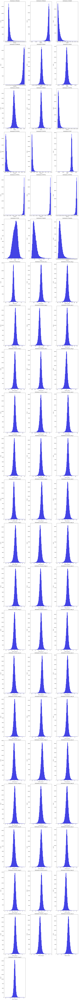

In [140]:
plot_feature_distributions(trading_data_transformed)

In [141]:
total_outlier_count = get_total_outlier_records(trading_data_transformed, get_all_training_features())
total_outlier_count

np.int64(37323)

In [142]:
trading_data_scaled = trading_data_transformed.copy()
trading_data_scaled.dropna(inplace=True)
trading_data_scaled, min_scaler = min_max_scaling(trading_data_scaled, inference=False)

In [143]:
trading_data_scaled.describe().T

,count,mean,min,25%,50%,75%,max,std
Date,97433,2023-07-02 03:34:51.076329216,2023-01-03 11:09:00,2023-03-31 14:07:00,2023-07-03 10:35:00,2023-10-02 10:02:00,2023-12-29 15:59:00,NaN
Open,97433.0,450.58518,391.569393,440.023191,451.286282,464.458501,484.446836,19.474364
High,97433.0,450.691076,391.919929,440.143159,451.380955,464.549084,484.584855,19.454306
Low,97433.0,450.477106,391.208547,439.901517,451.197252,464.365432,484.372093,19.492267
Close,97433.0,450.58588,391.579703,440.022911,451.286282,464.454173,484.452144,19.473979
Volume,97433.0,149742.237568,1039.0,70879.0,107488.0,170993.0,8399016.0,219310.072804
time_delta,97433.0,319.413956,-23340.0,60.0,60.0,60.0,322260.0,6405.936949
BOLLBU,97433.0,0.214751,0.0,0.178719,0.198153,0.231694,1.0,0.057565
BOLLBL,97433.0,0.870831,0.0,0.854376,0.883383,0.902602,1.0,0.0506
DONUP,97433.0,0.06924,0.0,0.020798,0.047854,0.093945,1.0,0.071668


In [144]:
def add_labels(df):
    num_bars = config['num_bars_output']
    df['High_Label'] = df['High'].rolling(window=num_bars).max().shift(-num_bars+1)
    df['Low_Label'] = df['Low'].rolling(window=num_bars).min().shift(-num_bars+1)
    df['High_Label'] = df['High_Label'] - df['Close']
    df['Low_Label'] = df['Close'] - df['Low_Label']
    df['High_Label'] = df['High_Label'] / df['Close'] * 10000
    df['Low_Label'] = df['Low_Label'] / df['Close'] * 10000
    return df

In [145]:
trading_data_scaled = add_labels(trading_data_scaled)

In [146]:
trading_data_scaled.dropna(inplace=True)

In [147]:
trading_data_scaled[['High_Label', 'Low_Label']].describe()

,High_Label,Low_Label
count,97414.000000,97414.000000
mean,11.170368,11.282778
std,10.439938,11.015805
min,0.000000,0.000000
25%,4.256623,3.992914
50%,8.259176,7.918947
75%,14.663271,14.868591
max,188.988502,153.543699


In [148]:
all_training_features = get_all_training_features()

In [149]:
X = trading_data_scaled[all_training_features]
y_high = trading_data_scaled['High_Label']
y_low = trading_data_scaled['Low_Label']

In [150]:
random_state = 42

#### Split all sets into 4 sets for training the 4 models

In [151]:
X_train_buy_take, X_test_buy_take, y_train_buy_take, y_test_buy_take = train_test_split(X, y_high, test_size=0.2, random_state=random_state)
X_train_sell_take, X_test_sell_take, y_train_sell_take, y_test_sell_take = train_test_split(X, y_low, test_size=0.2, random_state=random_state)


#### Create DMatrix for all datasets

In [152]:
dtrain_buy_take = xgb.QuantileDMatrix(X_train_buy_take, y_train_buy_take)
dtest_buy_take = xgb.QuantileDMatrix(X_test_buy_take, y_test_buy_take, ref=dtrain_buy_take)
dtrain_sell_take = xgb.QuantileDMatrix(X_train_sell_take, y_train_sell_take)
dtest_sell_take = xgb.QuantileDMatrix(X_test_sell_take, y_test_sell_take, ref=dtrain_sell_take)

In [163]:
metric = 'quantile'
base_params = {
    'objective': 'reg:quantileerror',
    'tree_method': 'hist',
    'eval_metric': metric,
}

In [154]:
num_boosting_rounds = 20000

In [155]:
def quantile_loss(ytrue, y_pred, quantile):
    residual = ytrue - y_pred
    return np.mean(np.maximum(quantile * residual, (quantile - 1) * residual))

def make_quantile_eval_metric(quantile):
    def quantile_eval(preds, dmatrix):
        labels = dmatrix.get_label()
        residual = labels - preds
        loss = np.maximum(quantile * residual, (quantile - 1) * residual)
        return f'q{quantile}_loss', np.mean(loss)
    return quantile_eval

In [175]:
##### CReate the objective function for optuna to tune tree parameters
def get_objective(dtrain, dtest, y_test, q_alpha):
    def objective(trial):
        debug_print = False
        params = {
            'gamma': trial.suggest_float('gamma', 0, 10),
            'max_depth': trial.suggest_int('max_depth', 3, 12),
            'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.3, log=True),
            'min_child_weight': trial.suggest_float('min_child_weight', 1, 10),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'lambda': trial.suggest_float('lambda', 0, 10), 
            'alpha': trial.suggest_float('alpha', 0, 10),
            'quantile_alpha': q_alpha
        }
        #'scale_pos_weight': trial.suggest_float('scale_pos_weight', min(buying_weight, selling_weight), max(buying_weight, selling_weight))
        params.update(base_params)
        #print(f"qalpha : {q_alpha}")
        #thresholds = [trial.suggest_float(f'threshold_{i}', 0.1, 0.9) for i in ]
        pruning_callback = optuna.integration.XGBoostPruningCallback(trial, f'test-{metric}')

        xgb_model = xgb.train(params=params, dtrain=dtrain, num_boost_round=num_boosting_rounds, 
                            evals=[(dtest, 'test')],
                            early_stopping_rounds=300,
                            verbose_eval=False,
                            callbacks=[pruning_callback],
                            )
        if debug_print:
            print(f"y_test = {y_test}")
        preds = xgb_model.predict(dtest)
        if debug_print:
            print(f"preds = {preds}")
        loss1 = quantile_loss(y_test, preds[:, 0], q_alpha[0])
        loss2 = quantile_loss(y_test, preds[:, 1], q_alpha[1])
        combined_score = np.mean([loss1, loss2])
        
        if debug_print:
            print(f"combined loss : {combined_score}")
        debug_print = False
        print(f"Trial {trial.number}: Best iteration = {xgb_model.best_iteration}, test rmse = {combined_score}")

        return combined_score
    
    return objective

In [176]:
dtrains = {
    'buy_take': dtrain_buy_take,
    'sell_take': dtrain_sell_take,
}

dtests = {
    'buy_take': dtest_buy_take,
    'sell_take': dtest_sell_take,
}
qalphas = {
    'buy_take': [0.25, 0.9],
    'sell_take': [0.25, 0.9]
}

ytests = {
    'buy_take': y_test_buy_take,
    'sell_take': y_test_sell_take
}

In [177]:
optuna_objectives = {
    'buy_take': get_objective(dtrains['buy_take'], dtests['buy_take'], ytests['buy_take'], np.array(qalphas['buy_take'])),
    'sell_take': get_objective(dtrains['sell_take'], dtests['sell_take'], ytests['sell_take'], np.array(qalphas['sell_take']))
}

In [178]:
studies_names = ['buy_take', 'sell_take']
studies = {}

In [179]:
for study_name in studies_names:
    studies[study_name] = optuna.create_study(direction='minimize')
    studies[study_name].optimize(optuna_objectives[study_name], n_trials=300)
    # Get the best parameters
    print(f" Best parameters for {study_name}: {studies[study_name].best_params}")
    print(f" Best Accuracy for {study_name}: {studies[study_name].best_value}")

[I 2025-03-23 01:04:30,179] A new study created in memory with name: no-name-2efb9863-8b44-4680-95e2-273cf4364b69
[I 2025-03-23 01:05:21,511] Trial 0 finished with value: 1.939359396018575 and parameters: {'gamma': 2.813178382415571, 'max_depth': 10, 'learning_rate': 0.15579363976977287, 'min_child_weight': 2.6838062561864398, 'subsample': 0.7986097856650245, 'colsample_bytree': 0.6740921121514039, 'lambda': 2.503284406462949, 'alpha': 4.565303684280484}. Best is trial 0 with value: 1.939359396018575.


Trial 0: Best iteration = 1711, test rmse = 1.939359396018575


[I 2025-03-23 01:06:07,378] Trial 1 finished with value: 1.9538537591387506 and parameters: {'gamma': 4.209069110612436, 'max_depth': 9, 'learning_rate': 0.03286431246029049, 'min_child_weight': 9.406292312266556, 'subsample': 0.5724513316018627, 'colsample_bytree': 0.7145942869593708, 'lambda': 5.910900814314112, 'alpha': 7.496352694437249}. Best is trial 0 with value: 1.939359396018575.


Trial 1: Best iteration = 1967, test rmse = 1.9538537591387506


[I 2025-03-23 01:08:25,225] Trial 2 finished with value: 1.9476939944763099 and parameters: {'gamma': 4.231341724384235, 'max_depth': 11, 'learning_rate': 0.0020134583762676833, 'min_child_weight': 5.802537559447386, 'subsample': 0.7076157555614337, 'colsample_bytree': 0.7522175882801911, 'lambda': 6.1285029416584536, 'alpha': 1.8432786635690146}. Best is trial 0 with value: 1.939359396018575.


Trial 2: Best iteration = 5506, test rmse = 1.9476939944763099


[I 2025-03-23 01:13:27,280] Trial 3 finished with value: 1.9126900285022663 and parameters: {'gamma': 0.7229184140949696, 'max_depth': 6, 'learning_rate': 0.00822872140343878, 'min_child_weight': 4.310019845837912, 'subsample': 0.8243930091409409, 'colsample_bytree': 0.804151799955932, 'lambda': 6.567428287814311, 'alpha': 8.440497032555022}. Best is trial 3 with value: 1.9126900285022663.


Trial 3: Best iteration = 10932, test rmse = 1.9126900285022663


[I 2025-03-23 01:13:43,798] Trial 4 finished with value: 1.9546499805196267 and parameters: {'gamma': 6.25077611695212, 'max_depth': 6, 'learning_rate': 0.2528427654970101, 'min_child_weight': 1.5937723737172698, 'subsample': 0.8558465199637106, 'colsample_bytree': 0.670521911836151, 'lambda': 0.201465705045476, 'alpha': 2.394519004619834}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:13:43,857] Trial 5 pruned. Trial was pruned at iteration 0.


Trial 4: Best iteration = 296, test rmse = 1.9546499805196267


[I 2025-03-23 01:13:45,780] Trial 6 pruned. Trial was pruned at iteration 92.
[I 2025-03-23 01:13:45,873] Trial 7 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:13:45,928] Trial 8 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:00,024] Trial 9 finished with value: 1.9316962911855557 and parameters: {'gamma': 1.3051559415510794, 'max_depth': 6, 'learning_rate': 0.13162626587818788, 'min_child_weight': 9.921691752225044, 'subsample': 0.648132019280725, 'colsample_bytree': 0.6630698467145955, 'lambda': 6.440453248521565, 'alpha': 3.9498822902381336}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:14:00,090] Trial 10 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:00,161] Trial 11 pruned. Trial was pruned at iteration 0.


Trial 9: Best iteration = 297, test rmse = 1.9316962911855557


[I 2025-03-23 01:14:00,227] Trial 12 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:00,303] Trial 13 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:00,368] Trial 14 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:00,443] Trial 15 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:00,515] Trial 16 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:00,585] Trial 17 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:00,662] Trial 18 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:00,726] Trial 19 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:00,794] Trial 20 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:23,400] Trial 21 finished with value: 1.942883050599093 and parameters: {'gamma': 2.651036081901893, 'max_depth': 9, 'learning_rate': 0.29532128393711926, 'min_child_weight': 2.7195466330107028, 'subsample': 0.7904928655402689, 'colsample_bytree': 0.641678816518359, 'lambda': 0

Trial 21: Best iteration = 582, test rmse = 1.942883050599093


[I 2025-03-23 01:14:23,866] Trial 22 pruned. Trial was pruned at iteration 16.
[I 2025-03-23 01:14:35,219] Trial 23 finished with value: 1.923244732286448 and parameters: {'gamma': 1.0256539766166943, 'max_depth': 9, 'learning_rate': 0.14826243841221895, 'min_child_weight': 2.3609004141974452, 'subsample': 0.7577748055284514, 'colsample_bytree': 0.6653802138282703, 'lambda': 1.49079266795488, 'alpha': 5.0712554059801676}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:14:35,328] Trial 24 pruned. Trial was pruned at iteration 0.


Trial 23: Best iteration = 110, test rmse = 1.923244732286448


[I 2025-03-23 01:14:35,826] Trial 25 pruned. Trial was pruned at iteration 18.
[I 2025-03-23 01:14:35,910] Trial 26 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:35,978] Trial 27 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:36,055] Trial 28 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:36,123] Trial 29 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:54,017] Trial 30 finished with value: 1.939523303671777 and parameters: {'gamma': 2.2904639606383643, 'max_depth': 10, 'learning_rate': 0.16007159734037715, 'min_child_weight': 2.109257018885218, 'subsample': 0.9103697208646274, 'colsample_bytree': 0.6405721834485695, 'lambda': 6.47851837791713, 'alpha': 5.045710295427445}. Best is trial 3 with value: 1.9126900285022663.


Trial 30: Best iteration = 315, test rmse = 1.939523303671777


[I 2025-03-23 01:14:54,570] Trial 31 pruned. Trial was pruned at iteration 19.
[I 2025-03-23 01:14:54,641] Trial 32 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:54,751] Trial 33 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:55,385] Trial 34 pruned. Trial was pruned at iteration 21.
[I 2025-03-23 01:14:55,455] Trial 35 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:55,533] Trial 36 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:55,614] Trial 37 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:14:55,681] Trial 38 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:15:07,402] Trial 39 finished with value: 1.9783851795959433 and parameters: {'gamma': 0.6193323503881498, 'max_depth': 12, 'learning_rate': 0.20632882337958727, 'min_child_weight': 1.4645237329498895, 'subsample': 0.5944268806649654, 'colsample_bytree': 0.6319360785227486, 'lambda': 6.2347774378453735, 'alpha': 6.130297270263262}. Best is trial 3 with val

Trial 39: Best iteration = 28, test rmse = 1.9783851795959433


[I 2025-03-23 01:15:07,633] Trial 42 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:15:07,720] Trial 43 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:15:07,794] Trial 44 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:15:15,820] Trial 45 pruned. Trial was pruned at iteration 334.
[I 2025-03-23 01:15:36,536] Trial 46 finished with value: 1.9321158787821897 and parameters: {'gamma': 1.4943031176294572, 'max_depth': 9, 'learning_rate': 0.1758613908899719, 'min_child_weight': 5.677726520184174, 'subsample': 0.805651298331396, 'colsample_bytree': 0.6125294219570597, 'lambda': 4.581938791240039, 'alpha': 7.323207846103267}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:15:36,615] Trial 47 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:15:36,693] Trial 48 pruned. Trial was pruned at iteration 0.


Trial 46: Best iteration = 485, test rmse = 1.9321158787821897


[I 2025-03-23 01:15:36,781] Trial 49 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:15:36,860] Trial 50 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:15:37,597] Trial 51 pruned. Trial was pruned at iteration 21.
[I 2025-03-23 01:16:28,312] Trial 52 finished with value: 1.9171126295233627 and parameters: {'gamma': 0.8000255925913653, 'max_depth': 10, 'learning_rate': 0.1715966776876147, 'min_child_weight': 9.180151535849221, 'subsample': 0.9172611892901469, 'colsample_bytree': 0.5774136269458137, 'lambda': 7.261762750405037, 'alpha': 7.199055129487669}. Best is trial 3 with value: 1.9126900285022663.


Trial 52: Best iteration = 1406, test rmse = 1.9171126295233627


[I 2025-03-23 01:16:39,407] Trial 53 finished with value: 1.9263551426392636 and parameters: {'gamma': 0.7249142768962673, 'max_depth': 10, 'learning_rate': 0.17713715610326672, 'min_child_weight': 9.00704387938616, 'subsample': 0.840404155634875, 'colsample_bytree': 0.5722816711789507, 'lambda': 9.011344706448966, 'alpha': 7.203054090007129}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:16:39,486] Trial 54 pruned. Trial was pruned at iteration 0.


Trial 53: Best iteration = 55, test rmse = 1.9263551426392636


[I 2025-03-23 01:16:50,193] Trial 55 finished with value: 1.9277893607961718 and parameters: {'gamma': 0.4600161716775922, 'max_depth': 8, 'learning_rate': 0.181565865721863, 'min_child_weight': 8.68226055220717, 'subsample': 0.8055790622950576, 'colsample_bytree': 0.5764824331531414, 'lambda': 8.8963832760093, 'alpha': 8.270094971874137}. Best is trial 3 with value: 1.9126900285022663.


Trial 55: Best iteration = 47, test rmse = 1.9277893607961718


[I 2025-03-23 01:17:01,486] Trial 56 finished with value: 1.9336044965197217 and parameters: {'gamma': 0.36841242492208465, 'max_depth': 8, 'learning_rate': 0.2521970111189765, 'min_child_weight': 8.543047291641011, 'subsample': 0.938835496326711, 'colsample_bytree': 0.5715748749545239, 'lambda': 8.871714348465694, 'alpha': 8.069263150508554}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:17:01,566] Trial 57 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:17:01,636] Trial 58 pruned. Trial was pruned at iteration 0.


Trial 56: Best iteration = 33, test rmse = 1.9336044965197217


[I 2025-03-23 01:17:01,719] Trial 59 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:17:01,793] Trial 60 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:17:54,433] Trial 61 finished with value: 1.9358296344420964 and parameters: {'gamma': 1.505837394163955, 'max_depth': 9, 'learning_rate': 0.18991649793582102, 'min_child_weight': 8.125233450286782, 'subsample': 0.8042167215314777, 'colsample_bytree': 0.6027288775718497, 'lambda': 9.257340262391743, 'alpha': 7.209773268589354}. Best is trial 3 with value: 1.9126900285022663.


Trial 61: Best iteration = 1711, test rmse = 1.9358296344420964


[I 2025-03-23 01:17:54,711] Trial 62 pruned. Trial was pruned at iteration 8.
[I 2025-03-23 01:17:55,656] Trial 63 pruned. Trial was pruned at iteration 21.
[I 2025-03-23 01:17:55,765] Trial 64 pruned. Trial was pruned at iteration 1.
[I 2025-03-23 01:17:55,846] Trial 65 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:17:55,924] Trial 66 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:17:56,591] Trial 67 pruned. Trial was pruned at iteration 21.
[I 2025-03-23 01:17:56,661] Trial 68 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:17:56,756] Trial 69 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:17:56,838] Trial 70 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:18:07,718] Trial 71 finished with value: 1.9319020880125415 and parameters: {'gamma': 0.3939727164107245, 'max_depth': 8, 'learning_rate': 0.2523566078284158, 'min_child_weight': 8.44900696862982, 'subsample': 0.9610247120071029, 'colsample_bytree': 0.5648225390031737, 'lambda':

Trial 71: Best iteration = 32, test rmse = 1.9319020880125415


[I 2025-03-23 01:18:20,183] Trial 73 finished with value: 1.931446943390004 and parameters: {'gamma': 0.4017601211145816, 'max_depth': 10, 'learning_rate': 0.20667514068770043, 'min_child_weight': 7.883556726055562, 'subsample': 0.9185974572697789, 'colsample_bytree': 0.5999128024543674, 'lambda': 8.640068862573264, 'alpha': 7.939646845871325}. Best is trial 3 with value: 1.9126900285022663.


Trial 73: Best iteration = 25, test rmse = 1.931446943390004


[I 2025-03-23 01:18:34,710] Trial 74 finished with value: 2.0114077602745524 and parameters: {'gamma': 0.055863430181752216, 'max_depth': 10, 'learning_rate': 0.22957952676676624, 'min_child_weight': 7.805106369864278, 'subsample': 0.9279513308752169, 'colsample_bytree': 0.532028717811118, 'lambda': 9.437464397091478, 'alpha': 8.578299232924932}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:18:34,786] Trial 75 pruned. Trial was pruned at iteration 0.


Trial 74: Best iteration = 17, test rmse = 2.0114077602745524


[I 2025-03-23 01:18:47,493] Trial 76 finished with value: 1.9251616087061774 and parameters: {'gamma': 0.8007852587375508, 'max_depth': 7, 'learning_rate': 0.20323053701173374, 'min_child_weight': 9.202077495429421, 'subsample': 0.9828544428235035, 'colsample_bytree': 0.5928618039821579, 'lambda': 7.389441637010125, 'alpha': 7.991298345809274}. Best is trial 3 with value: 1.9126900285022663.


Trial 76: Best iteration = 118, test rmse = 1.9251616087061774


[I 2025-03-23 01:18:47,912] Trial 77 pruned. Trial was pruned at iteration 13.
[I 2025-03-23 01:18:47,984] Trial 78 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:18:48,054] Trial 79 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:18:57,294] Trial 80 finished with value: 1.9382587586738005 and parameters: {'gamma': 0.7973729361827775, 'max_depth': 7, 'learning_rate': 0.20402578825892698, 'min_child_weight': 9.990078869771997, 'subsample': 0.5984399094536492, 'colsample_bytree': 0.8210099021567205, 'lambda': 6.637112279570424, 'alpha': 3.907716636078894}. Best is trial 3 with value: 1.9126900285022663.


Trial 80: Best iteration = 42, test rmse = 1.9382587586738005


[I 2025-03-23 01:19:09,334] Trial 81 finished with value: 1.9436257226040075 and parameters: {'gamma': 0.4843215794019151, 'max_depth': 10, 'learning_rate': 0.2634122440865557, 'min_child_weight': 8.656467850464336, 'subsample': 0.9543187652055175, 'colsample_bytree': 0.557446541709957, 'lambda': 8.246303555815036, 'alpha': 7.9749693271754625}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:19:09,467] Trial 82 pruned. Trial was pruned at iteration 0.


Trial 81: Best iteration = 29, test rmse = 1.9436257226040075


[I 2025-03-23 01:19:09,562] Trial 83 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:19:48,381] Trial 84 finished with value: 1.9287612886066063 and parameters: {'gamma': 1.1640635297974886, 'max_depth': 8, 'learning_rate': 0.25828684342960717, 'min_child_weight': 9.60083502985584, 'subsample': 0.9792631258469467, 'colsample_bytree': 0.806805295270394, 'lambda': 8.737523835157734, 'alpha': 7.928501655937738}. Best is trial 3 with value: 1.9126900285022663.


Trial 84: Best iteration = 950, test rmse = 1.9287612886066063


[I 2025-03-23 01:20:14,655] Trial 85 finished with value: 1.927380850058617 and parameters: {'gamma': 1.2782754771415186, 'max_depth': 9, 'learning_rate': 0.29238500949665636, 'min_child_weight': 9.64112218355973, 'subsample': 0.9781009702426622, 'colsample_bytree': 0.8018510996573152, 'lambda': 7.814713197638657, 'alpha': 8.348105897374987}. Best is trial 3 with value: 1.9126900285022663.


Trial 85: Best iteration = 544, test rmse = 1.927380850058617


[I 2025-03-23 01:20:24,335] Trial 86 finished with value: 1.9294930845424885 and parameters: {'gamma': 1.1954232048781996, 'max_depth': 9, 'learning_rate': 0.2917782643576246, 'min_child_weight': 9.60684367725033, 'subsample': 0.9764214667927288, 'colsample_bytree': 0.8398413790889939, 'lambda': 8.043856222712234, 'alpha': 8.393081316747487}. Best is trial 3 with value: 1.9126900285022663.


Trial 86: Best iteration = 16, test rmse = 1.9294930845424885


[I 2025-03-23 01:20:24,853] Trial 87 pruned. Trial was pruned at iteration 15.
[I 2025-03-23 01:20:24,936] Trial 88 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:20:25,540] Trial 89 pruned. Trial was pruned at iteration 17.
[I 2025-03-23 01:20:25,613] Trial 90 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:20:36,357] Trial 91 finished with value: 1.9229905658971123 and parameters: {'gamma': 0.9400042682439207, 'max_depth': 10, 'learning_rate': 0.2203509640960996, 'min_child_weight': 8.90880654003585, 'subsample': 0.9074274420047392, 'colsample_bytree': 0.8342602830670324, 'lambda': 9.483034097971816, 'alpha': 8.028789641969285}. Best is trial 3 with value: 1.9126900285022663.


Trial 91: Best iteration = 57, test rmse = 1.9229905658971123


[I 2025-03-23 01:21:00,091] Trial 92 finished with value: 1.9244087542985642 and parameters: {'gamma': 1.0903961835993288, 'max_depth': 10, 'learning_rate': 0.2151668957855947, 'min_child_weight': 8.78567607224955, 'subsample': 0.8851884503510092, 'colsample_bytree': 0.8101631468652509, 'lambda': 8.92475728817141, 'alpha': 7.544432524154825}. Best is trial 3 with value: 1.9126900285022663.


Trial 92: Best iteration = 528, test rmse = 1.9244087542985642


[I 2025-03-23 01:21:11,524] Trial 93 finished with value: 1.9244664696127054 and parameters: {'gamma': 0.9208175839231392, 'max_depth': 10, 'learning_rate': 0.22449390975687236, 'min_child_weight': 8.931763090101187, 'subsample': 0.8751706002460493, 'colsample_bytree': 0.8096670078815192, 'lambda': 9.586882658803647, 'alpha': 8.124673640409819}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:21:11,614] Trial 94 pruned. Trial was pruned at iteration 0.


Trial 93: Best iteration = 80, test rmse = 1.9244664696127054


[I 2025-03-23 01:21:22,937] Trial 95 finished with value: 1.9253182807612867 and parameters: {'gamma': 0.7539697039244511, 'max_depth': 11, 'learning_rate': 0.22205228887808276, 'min_child_weight': 8.656033953972356, 'subsample': 0.8903161543205417, 'colsample_bytree': 0.76100268813029, 'lambda': 9.064375060570958, 'alpha': 8.93430557433479}. Best is trial 3 with value: 1.9126900285022663.


Trial 95: Best iteration = 35, test rmse = 1.9253182807612867


[I 2025-03-23 01:21:23,575] Trial 96 pruned. Trial was pruned at iteration 17.
[I 2025-03-23 01:21:34,023] Trial 97 finished with value: 1.9203196271265093 and parameters: {'gamma': 0.8339854847944179, 'max_depth': 12, 'learning_rate': 0.20840604356331405, 'min_child_weight': 9.099187078221421, 'subsample': 0.887449512846201, 'colsample_bytree': 0.7764272863651496, 'lambda': 9.080903272036984, 'alpha': 9.530980356418507}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:21:34,115] Trial 98 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:21:34,193] Trial 99 pruned. Trial was pruned at iteration 0.


Trial 97: Best iteration = 37, test rmse = 1.9203196271265093


[I 2025-03-23 01:21:34,276] Trial 100 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:21:45,817] Trial 101 finished with value: 1.925953549052597 and parameters: {'gamma': 0.6790853628973758, 'max_depth': 10, 'learning_rate': 0.2312712177780256, 'min_child_weight': 8.500270226672901, 'subsample': 0.8652349143955409, 'colsample_bytree': 0.7934093848276608, 'lambda': 9.606481309894022, 'alpha': 9.476617729848073}. Best is trial 3 with value: 1.9126900285022663.


Trial 101: Best iteration = 47, test rmse = 1.925953549052597


[I 2025-03-23 01:21:57,569] Trial 102 finished with value: 1.92592424537014 and parameters: {'gamma': 0.6407781450486476, 'max_depth': 11, 'learning_rate': 0.22416679513231322, 'min_child_weight': 8.056761045901242, 'subsample': 0.9102445467566994, 'colsample_bytree': 0.8297271398415954, 'lambda': 9.148725952696951, 'alpha': 9.538702065156397}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:21:57,665] Trial 103 pruned. Trial was pruned at iteration 0.


Trial 102: Best iteration = 19, test rmse = 1.92592424537014


[I 2025-03-23 01:22:08,828] Trial 104 finished with value: 1.9308509661220972 and parameters: {'gamma': 0.6469775792256193, 'max_depth': 11, 'learning_rate': 0.21578545790855255, 'min_child_weight': 8.457251026869596, 'subsample': 0.8651926810279928, 'colsample_bytree': 0.8155106876637062, 'lambda': 9.778227416688242, 'alpha': 9.986015474775092}. Best is trial 3 with value: 1.9126900285022663.


Trial 104: Best iteration = 27, test rmse = 1.9308509661220972


[I 2025-03-23 01:22:25,060] Trial 105 finished with value: 2.0092145078082204 and parameters: {'gamma': 0.22761983974999855, 'max_depth': 11, 'learning_rate': 0.22977209539042262, 'min_child_weight': 6.044579000374078, 'subsample': 0.8760383178496933, 'colsample_bytree': 0.8558971135175477, 'lambda': 9.65595780900137, 'alpha': 9.124184594210252}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:22:25,150] Trial 106 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:22:25,234] Trial 107 pruned. Trial was pruned at iteration 0.


Trial 105: Best iteration = 15, test rmse = 2.0092145078082204


[I 2025-03-23 01:22:25,328] Trial 108 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:22:25,420] Trial 109 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:22:25,522] Trial 110 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:22:36,190] Trial 111 finished with value: 1.9331188962489019 and parameters: {'gamma': 0.6831014944897024, 'max_depth': 10, 'learning_rate': 0.24047785669389263, 'min_child_weight': 9.022512394249226, 'subsample': 0.8343384930409419, 'colsample_bytree': 0.8286618640194644, 'lambda': 8.934092787210876, 'alpha': 9.612137668182836}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:22:36,276] Trial 112 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:22:36,366] Trial 113 pruned. Trial was pruned at iteration 0.


Trial 111: Best iteration = 23, test rmse = 1.9331188962489019


[I 2025-03-23 01:22:37,964] Trial 114 pruned. Trial was pruned at iteration 25.
[I 2025-03-23 01:22:38,053] Trial 115 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:22:38,144] Trial 116 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:22:38,235] Trial 117 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:22:38,325] Trial 118 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:22:38,430] Trial 119 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:22:38,764] Trial 120 pruned. Trial was pruned at iteration 8.
[I 2025-03-23 01:22:39,548] Trial 121 pruned. Trial was pruned at iteration 20.
[I 2025-03-23 01:22:51,735] Trial 122 finished with value: 1.9304499135588546 and parameters: {'gamma': 0.6085677841394883, 'max_depth': 10, 'learning_rate': 0.24937852572242075, 'min_child_weight': 9.048682056133083, 'subsample': 0.9187770162252963, 'colsample_bytree': 0.849126754990883, 'lambda': 7.515959813192529, 'alpha': 7.74339342688518}. Best is trial 3 wit

Trial 122: Best iteration = 17, test rmse = 1.9304499135588546


[I 2025-03-23 01:22:52,214] Trial 123 pruned. Trial was pruned at iteration 12.
[I 2025-03-23 01:22:52,644] Trial 124 pruned. Trial was pruned at iteration 11.
[I 2025-03-23 01:22:53,421] Trial 125 pruned. Trial was pruned at iteration 19.
[I 2025-03-23 01:22:53,494] Trial 126 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:22:53,569] Trial 127 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:22:53,671] Trial 128 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:05,701] Trial 129 finished with value: 1.9351466238773365 and parameters: {'gamma': 0.5763607715455512, 'max_depth': 10, 'learning_rate': 0.24452863409861714, 'min_child_weight': 8.627297407326356, 'subsample': 0.896619514224258, 'colsample_bytree': 0.8373446460242214, 'lambda': 9.401546256647295, 'alpha': 8.326834694102521}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:23:05,792] Trial 130 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:05,888] Trial 131 pruned. Tr

Trial 129: Best iteration = 17, test rmse = 1.9351466238773365


[I 2025-03-23 01:23:05,978] Trial 132 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:28,630] Trial 133 finished with value: 1.9240899749374445 and parameters: {'gamma': 0.9834246635158526, 'max_depth': 10, 'learning_rate': 0.22001148142682006, 'min_child_weight': 8.935000997149658, 'subsample': 0.8397878043807475, 'colsample_bytree': 0.7659560877227015, 'lambda': 9.542446783236823, 'alpha': 7.852609312812071}. Best is trial 3 with value: 1.9126900285022663.


Trial 133: Best iteration = 498, test rmse = 1.9240899749374445


[I 2025-03-23 01:23:29,187] Trial 134 pruned. Trial was pruned at iteration 14.
[I 2025-03-23 01:23:30,085] Trial 135 pruned. Trial was pruned at iteration 23.
[I 2025-03-23 01:23:30,158] Trial 136 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:30,498] Trial 137 pruned. Trial was pruned at iteration 10.
[I 2025-03-23 01:23:30,590] Trial 138 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:30,696] Trial 139 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:31,403] Trial 140 pruned. Trial was pruned at iteration 18.
[I 2025-03-23 01:23:31,485] Trial 141 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:31,570] Trial 142 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:31,659] Trial 143 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:31,960] Trial 144 pruned. Trial was pruned at iteration 7.
[I 2025-03-23 01:23:32,046] Trial 145 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:32,652] Trial 146 pruned. Tr

Trial 149: Best iteration = 18, test rmse = 1.9316294172067103


[I 2025-03-23 01:23:43,607] Trial 151 pruned. Trial was pruned at iteration 13.
[I 2025-03-23 01:23:43,694] Trial 152 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:43,777] Trial 153 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:44,194] Trial 154 pruned. Trial was pruned at iteration 11.
[I 2025-03-23 01:23:44,282] Trial 155 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:45,033] Trial 156 pruned. Trial was pruned at iteration 19.
[I 2025-03-23 01:23:45,118] Trial 157 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:45,193] Trial 158 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:23:56,441] Trial 159 finished with value: 1.9400875821342405 and parameters: {'gamma': 0.6298660838625273, 'max_depth': 10, 'learning_rate': 0.2971493406050172, 'min_child_weight': 8.937741435893416, 'subsample': 0.8947285267981574, 'colsample_bytree': 0.788774655460213, 'lambda': 6.367765877395839, 'alpha': 9.146711145271903}. Best is trial 3 wi

Trial 159: Best iteration = 18, test rmse = 1.9400875821342405


[I 2025-03-23 01:23:56,718] Trial 160 pruned. Trial was pruned at iteration 8.
[I 2025-03-23 01:23:57,561] Trial 161 pruned. Trial was pruned at iteration 22.
[I 2025-03-23 01:24:12,369] Trial 162 finished with value: 1.9191367323934636 and parameters: {'gamma': 0.843908761638554, 'max_depth': 9, 'learning_rate': 0.22986456258348154, 'min_child_weight': 9.739328065788984, 'subsample': 0.9910912714402538, 'colsample_bytree': 0.8372912219860826, 'lambda': 8.379837439737093, 'alpha': 8.120124085177048}. Best is trial 3 with value: 1.9126900285022663.


Trial 162: Best iteration = 171, test rmse = 1.9191367323934636


[I 2025-03-23 01:24:23,622] Trial 163 finished with value: 1.915396259933833 and parameters: {'gamma': 0.8352274029245746, 'max_depth': 9, 'learning_rate': 0.22658575383866625, 'min_child_weight': 9.755081900546923, 'subsample': 0.9859662204480044, 'colsample_bytree': 0.8416793810218679, 'lambda': 8.418793616070966, 'alpha': 2.039531720254394}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:24:23,712] Trial 164 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:24:23,814] Trial 165 pruned. Trial was pruned at iteration 0.


Trial 163: Best iteration = 21, test rmse = 1.915396259933833


[I 2025-03-23 01:24:23,917] Trial 166 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:24:23,996] Trial 167 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:24:24,095] Trial 168 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:24:24,306] Trial 169 pruned. Trial was pruned at iteration 3.
[I 2025-03-23 01:24:24,405] Trial 170 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:24:34,715] Trial 171 finished with value: 1.9200029500695754 and parameters: {'gamma': 0.75575436922881, 'max_depth': 9, 'learning_rate': 0.24337866138234815, 'min_child_weight': 9.494376209812264, 'subsample': 0.9725725054661583, 'colsample_bytree': 0.8089510744010976, 'lambda': 8.73576720661021, 'alpha': 7.435551519849435}. Best is trial 3 with value: 1.9126900285022663.


Trial 171: Best iteration = 26, test rmse = 1.9200029500695754


[I 2025-03-23 01:24:45,141] Trial 172 finished with value: 1.9198210046213062 and parameters: {'gamma': 0.8372139242299038, 'max_depth': 9, 'learning_rate': 0.2377011971625339, 'min_child_weight': 9.567731434990007, 'subsample': 0.969856218714895, 'colsample_bytree': 0.8138521339085167, 'lambda': 8.824578877776998, 'alpha': 7.421031478493927}. Best is trial 3 with value: 1.9126900285022663.


Trial 172: Best iteration = 32, test rmse = 1.9198210046213062


[I 2025-03-23 01:24:56,614] Trial 173 finished with value: 1.9227926135452038 and parameters: {'gamma': 0.8318215455490245, 'max_depth': 9, 'learning_rate': 0.24560273589081125, 'min_child_weight': 9.590147854454806, 'subsample': 0.9586799033928504, 'colsample_bytree': 0.8128313647963094, 'lambda': 8.745138323533602, 'alpha': 1.9088394659641539}. Best is trial 3 with value: 1.9126900285022663.


Trial 173: Best iteration = 29, test rmse = 1.9227926135452038


[I 2025-03-23 01:25:09,752] Trial 174 finished with value: 1.9262450387686885 and parameters: {'gamma': 0.7218678421609286, 'max_depth': 9, 'learning_rate': 0.236981844397641, 'min_child_weight': 9.43295338632926, 'subsample': 0.9670050010492874, 'colsample_bytree': 0.8128446206044172, 'lambda': 8.824115347894528, 'alpha': 1.7423478891236095}. Best is trial 3 with value: 1.9126900285022663.


Trial 174: Best iteration = 39, test rmse = 1.9262450387686885


[I 2025-03-23 01:25:22,605] Trial 175 finished with value: 1.9219446981087396 and parameters: {'gamma': 0.9155687205333237, 'max_depth': 9, 'learning_rate': 0.23178931722385035, 'min_child_weight': 9.536598571396745, 'subsample': 0.9463621928318409, 'colsample_bytree': 0.8143026501710725, 'lambda': 8.785881702734109, 'alpha': 1.2303748850188092}. Best is trial 3 with value: 1.9126900285022663.
[I 2025-03-23 01:25:22,701] Trial 176 pruned. Trial was pruned at iteration 0.


Trial 175: Best iteration = 51, test rmse = 1.9219446981087396


[I 2025-03-23 01:25:34,058] Trial 177 finished with value: 1.911492710326323 and parameters: {'gamma': 1.0228659198455046, 'max_depth': 9, 'learning_rate': 0.24485884697686605, 'min_child_weight': 9.51075283348973, 'subsample': 0.9491113023301685, 'colsample_bytree': 0.8255473792293956, 'lambda': 8.634154529259453, 'alpha': 1.3803703458743306}. Best is trial 177 with value: 1.911492710326323.


Trial 177: Best iteration = 38, test rmse = 1.911492710326323


[I 2025-03-23 01:25:44,248] Trial 178 finished with value: 1.926823228531099 and parameters: {'gamma': 1.037618981860271, 'max_depth': 9, 'learning_rate': 0.26738319473253863, 'min_child_weight': 9.575363837593727, 'subsample': 0.942118147349743, 'colsample_bytree': 0.8285210006917599, 'lambda': 8.654895232022316, 'alpha': 1.490111983054757}. Best is trial 177 with value: 1.911492710326323.
[I 2025-03-23 01:25:44,353] Trial 179 pruned. Trial was pruned at iteration 0.


Trial 178: Best iteration = 18, test rmse = 1.926823228531099


[I 2025-03-23 01:25:59,369] Trial 180 finished with value: 1.9093882786947614 and parameters: {'gamma': 1.4420818389676937, 'max_depth': 9, 'learning_rate': 0.24302619326774175, 'min_child_weight': 9.46243160417995, 'subsample': 0.962587174602394, 'colsample_bytree': 0.8458183200355596, 'lambda': 8.814797893810866, 'alpha': 1.1637747164343504}. Best is trial 180 with value: 1.9093882786947614.


Trial 180: Best iteration = 195, test rmse = 1.9093882786947614


[I 2025-03-23 01:26:16,389] Trial 181 finished with value: 1.9140852987792734 and parameters: {'gamma': 1.4162024075334085, 'max_depth': 9, 'learning_rate': 0.2369879284494923, 'min_child_weight': 9.99653321691862, 'subsample': 0.957875403979302, 'colsample_bytree': 0.8445723348887655, 'lambda': 8.83798233546282, 'alpha': 1.1660539543256871}. Best is trial 180 with value: 1.9093882786947614.


Trial 181: Best iteration = 255, test rmse = 1.9140852987792734


[I 2025-03-23 01:26:36,989] Trial 182 finished with value: 1.9162727286572998 and parameters: {'gamma': 1.5456649533282252, 'max_depth': 9, 'learning_rate': 0.24525471639158086, 'min_child_weight': 9.5543285695498, 'subsample': 0.9642405342067965, 'colsample_bytree': 0.8481759298175308, 'lambda': 8.68664520931358, 'alpha': 1.1289607126275627}. Best is trial 180 with value: 1.9093882786947614.


Trial 182: Best iteration = 380, test rmse = 1.9162727286572998


[I 2025-03-23 01:26:47,561] Trial 183 finished with value: 1.9187325920563747 and parameters: {'gamma': 1.3767048300691997, 'max_depth': 9, 'learning_rate': 0.261692580901353, 'min_child_weight': 9.962725621494123, 'subsample': 0.966470289861582, 'colsample_bytree': 0.8472330533297242, 'lambda': 8.581332508833672, 'alpha': 1.0937255281028984}. Best is trial 180 with value: 1.9093882786947614.


Trial 183: Best iteration = 44, test rmse = 1.9187325920563747


[I 2025-03-23 01:27:02,492] Trial 184 finished with value: 1.9162262315780838 and parameters: {'gamma': 1.6375085201603161, 'max_depth': 9, 'learning_rate': 0.2523502797863476, 'min_child_weight': 9.989034900900545, 'subsample': 0.9483390144037344, 'colsample_bytree': 0.8611706164050832, 'lambda': 8.607669018559053, 'alpha': 1.0626700528257167}. Best is trial 180 with value: 1.9093882786947614.


Trial 184: Best iteration = 197, test rmse = 1.9162262315780838


[I 2025-03-23 01:27:03,457] Trial 185 pruned. Trial was pruned at iteration 27.
[I 2025-03-23 01:27:14,836] Trial 186 finished with value: 1.9151957817161045 and parameters: {'gamma': 1.63043510694731, 'max_depth': 9, 'learning_rate': 0.2508327398140401, 'min_child_weight': 9.675659379241173, 'subsample': 0.9570398446024216, 'colsample_bytree': 0.8600610867585532, 'lambda': 8.698693125348965, 'alpha': 0.9615386920981006}. Best is trial 180 with value: 1.9093882786947614.


Trial 186: Best iteration = 69, test rmse = 1.9151957817161045


[I 2025-03-23 01:27:29,797] Trial 187 finished with value: 1.9163913612512824 and parameters: {'gamma': 1.7657730331434602, 'max_depth': 9, 'learning_rate': 0.26083119019455264, 'min_child_weight': 9.710174381028697, 'subsample': 0.9557717297539666, 'colsample_bytree': 0.8595495456960794, 'lambda': 8.596193817501508, 'alpha': 0.8954753215428871}. Best is trial 180 with value: 1.9093882786947614.


Trial 187: Best iteration = 197, test rmse = 1.9163913612512824


[I 2025-03-23 01:27:30,349] Trial 188 pruned. Trial was pruned at iteration 13.
[I 2025-03-23 01:27:41,256] Trial 189 finished with value: 1.916189220247678 and parameters: {'gamma': 1.5860760660233688, 'max_depth': 9, 'learning_rate': 0.2529653717774937, 'min_child_weight': 9.702075904880644, 'subsample': 0.9676333170955105, 'colsample_bytree': 0.8826469026144772, 'lambda': 8.327315422144592, 'alpha': 1.3728551981679005}. Best is trial 180 with value: 1.9093882786947614.


Trial 189: Best iteration = 56, test rmse = 1.916189220247678


[I 2025-03-23 01:27:41,642] Trial 190 pruned. Trial was pruned at iteration 9.
[I 2025-03-23 01:28:01,077] Trial 191 finished with value: 1.9161557993700995 and parameters: {'gamma': 1.559109359984045, 'max_depth': 9, 'learning_rate': 0.248403300219477, 'min_child_weight': 9.819789156257285, 'subsample': 0.9546390422600244, 'colsample_bytree': 0.8835931705968189, 'lambda': 8.760030221387664, 'alpha': 0.8497430938417783}. Best is trial 180 with value: 1.9093882786947614.


Trial 191: Best iteration = 339, test rmse = 1.9161557993700995


[I 2025-03-23 01:28:20,312] Trial 192 finished with value: 1.9193079933002903 and parameters: {'gamma': 1.6778113254652247, 'max_depth': 9, 'learning_rate': 0.26974222493613187, 'min_child_weight': 9.81287384452512, 'subsample': 0.9569089660014279, 'colsample_bytree': 0.8850484703591843, 'lambda': 8.665793164946155, 'alpha': 0.9957233028915298}. Best is trial 180 with value: 1.9093882786947614.


Trial 192: Best iteration = 339, test rmse = 1.9193079933002903


[I 2025-03-23 01:28:38,133] Trial 193 finished with value: 1.9227099922210618 and parameters: {'gamma': 1.7418357097096322, 'max_depth': 9, 'learning_rate': 0.27506584563496966, 'min_child_weight': 9.824901827115909, 'subsample': 0.9544002219991823, 'colsample_bytree': 0.889663674616238, 'lambda': 8.596988193150496, 'alpha': 0.8141089238583188}. Best is trial 180 with value: 1.9093882786947614.


Trial 193: Best iteration = 288, test rmse = 1.9227099922210618


[I 2025-03-23 01:28:53,332] Trial 194 finished with value: 1.9171922726604516 and parameters: {'gamma': 1.645165760421829, 'max_depth': 9, 'learning_rate': 0.2722958957672237, 'min_child_weight': 9.818811522532908, 'subsample': 0.970543572203817, 'colsample_bytree': 0.9066623198651945, 'lambda': 8.513416961997267, 'alpha': 0.8522946738522212}. Best is trial 180 with value: 1.9093882786947614.


Trial 194: Best iteration = 199, test rmse = 1.9171922726604516


[I 2025-03-23 01:28:53,920] Trial 195 pruned. Trial was pruned at iteration 15.
[I 2025-03-23 01:29:12,167] Trial 196 finished with value: 1.917016381873315 and parameters: {'gamma': 1.9117806413472422, 'max_depth': 9, 'learning_rate': 0.2654559359128916, 'min_child_weight': 9.759577999542163, 'subsample': 0.9385597783957063, 'colsample_bytree': 0.9031349554174666, 'lambda': 8.440588999099013, 'alpha': 0.0018631661828791835}. Best is trial 180 with value: 1.9093882786947614.


Trial 196: Best iteration = 310, test rmse = 1.917016381873315


[I 2025-03-23 01:29:22,029] Trial 197 finished with value: 1.9216497577667369 and parameters: {'gamma': 1.6292227472518745, 'max_depth': 9, 'learning_rate': 0.269513983021469, 'min_child_weight': 9.752981035938362, 'subsample': 0.9374838568255569, 'colsample_bytree': 0.8661183930669766, 'lambda': 8.434856427593033, 'alpha': 0.19588859299348127}. Best is trial 180 with value: 1.9093882786947614.


Trial 197: Best iteration = 26, test rmse = 1.9216497577667369


[I 2025-03-23 01:29:47,572] Trial 198 finished with value: 1.9197152137798241 and parameters: {'gamma': 1.8106783788007212, 'max_depth': 9, 'learning_rate': 0.2999505458121828, 'min_child_weight': 9.847172092297694, 'subsample': 0.9693969272535294, 'colsample_bytree': 0.9137745895569268, 'lambda': 8.036575048492406, 'alpha': 0.7520025876841442}. Best is trial 180 with value: 1.9093882786947614.


Trial 198: Best iteration = 544, test rmse = 1.9197152137798241


[I 2025-03-23 01:29:48,140] Trial 199 pruned. Trial was pruned at iteration 14.
[I 2025-03-23 01:30:13,833] Trial 200 finished with value: 1.9204167733978443 and parameters: {'gamma': 2.064781445453643, 'max_depth': 9, 'learning_rate': 0.2670670278610521, 'min_child_weight': 9.646566623341755, 'subsample': 0.9765332913740408, 'colsample_bytree': 0.8892449105680482, 'lambda': 8.368148258939499, 'alpha': 0.8927280042921701}. Best is trial 180 with value: 1.9093882786947614.


Trial 200: Best iteration = 542, test rmse = 1.9204167733978443


[I 2025-03-23 01:30:39,136] Trial 201 finished with value: 1.912969616464252 and parameters: {'gamma': 1.7005607905254287, 'max_depth': 9, 'learning_rate': 0.2480319212001709, 'min_child_weight': 9.856094822718363, 'subsample': 0.9581654826325459, 'colsample_bytree': 0.9076936307274163, 'lambda': 8.5616508984825, 'alpha': 0.5795044443858072}. Best is trial 180 with value: 1.9093882786947614.


Trial 201: Best iteration = 544, test rmse = 1.912969616464252


[I 2025-03-23 01:30:53,958] Trial 202 finished with value: 1.9183216751122742 and parameters: {'gamma': 1.704179717181908, 'max_depth': 9, 'learning_rate': 0.2976910803601473, 'min_child_weight': 9.972372626686475, 'subsample': 0.9622025854764404, 'colsample_bytree': 0.9086699481449683, 'lambda': 8.61601376665481, 'alpha': 0.5230260473225743}. Best is trial 180 with value: 1.9093882786947614.


Trial 202: Best iteration = 189, test rmse = 1.9183216751122742


[I 2025-03-23 01:31:13,383] Trial 203 finished with value: 1.916767109749951 and parameters: {'gamma': 1.6900099083016002, 'max_depth': 9, 'learning_rate': 0.291303676238762, 'min_child_weight': 9.87173585492575, 'subsample': 0.9557049358171326, 'colsample_bytree': 0.9101026835176971, 'lambda': 8.52269797349685, 'alpha': 0.02590627925674127}. Best is trial 180 with value: 1.9093882786947614.


Trial 203: Best iteration = 339, test rmse = 1.916767109749951


[I 2025-03-23 01:31:30,168] Trial 204 finished with value: 1.921478335708442 and parameters: {'gamma': 1.786402302596044, 'max_depth': 9, 'learning_rate': 0.2901294826344377, 'min_child_weight': 9.997567446134733, 'subsample': 0.9581332728639473, 'colsample_bytree': 0.9101701255391945, 'lambda': 8.249384188341955, 'alpha': 0.10372090925267191}. Best is trial 180 with value: 1.9093882786947614.


Trial 204: Best iteration = 255, test rmse = 1.921478335708442


[I 2025-03-23 01:31:39,917] Trial 205 finished with value: 1.9180082675659125 and parameters: {'gamma': 1.592722994204992, 'max_depth': 9, 'learning_rate': 0.29188410780836704, 'min_child_weight': 9.854514775105166, 'subsample': 0.940295767067154, 'colsample_bytree': 0.9277831849450746, 'lambda': 7.977885592114061, 'alpha': 0.5018205830375441}. Best is trial 180 with value: 1.9093882786947614.


Trial 205: Best iteration = 16, test rmse = 1.9180082675659125


[I 2025-03-23 01:32:00,886] Trial 206 finished with value: 1.9165726808789874 and parameters: {'gamma': 1.6482705066544605, 'max_depth': 9, 'learning_rate': 0.2572779399973706, 'min_child_weight': 9.7211023541801, 'subsample': 0.935119132444291, 'colsample_bytree': 0.9358981129112685, 'lambda': 8.518432330308014, 'alpha': 0.4508464409384031}. Best is trial 180 with value: 1.9093882786947614.


Trial 206: Best iteration = 391, test rmse = 1.9165726808789874


[I 2025-03-23 01:32:10,718] Trial 207 finished with value: 1.9154651770628868 and parameters: {'gamma': 1.5495869425665503, 'max_depth': 9, 'learning_rate': 0.25485442317972995, 'min_child_weight': 9.705761689178885, 'subsample': 0.9374513973162836, 'colsample_bytree': 0.9397907095624685, 'lambda': 8.491657487364966, 'alpha': 0.4079151985212891}. Best is trial 180 with value: 1.9093882786947614.


Trial 207: Best iteration = 22, test rmse = 1.9154651770628868


[I 2025-03-23 01:32:25,693] Trial 208 finished with value: 1.9182701439105525 and parameters: {'gamma': 1.5196201293760834, 'max_depth': 9, 'learning_rate': 0.24963172402147316, 'min_child_weight': 9.681162804425773, 'subsample': 0.9371673777623982, 'colsample_bytree': 0.9049002220365131, 'lambda': 7.959688655751564, 'alpha': 0.5893882978565999}. Best is trial 180 with value: 1.9093882786947614.


Trial 208: Best iteration = 197, test rmse = 1.9182701439105525


[I 2025-03-23 01:32:26,351] Trial 209 pruned. Trial was pruned at iteration 17.
[I 2025-03-23 01:32:54,486] Trial 210 finished with value: 1.9154698319834726 and parameters: {'gamma': 1.5530926485622967, 'max_depth': 9, 'learning_rate': 0.2902775654242808, 'min_child_weight': 9.467506931597395, 'subsample': 0.9295591346924418, 'colsample_bytree': 0.9244504978517629, 'lambda': 8.183815403337388, 'alpha': 0.3212978612821555}. Best is trial 180 with value: 1.9093882786947614.


Trial 210: Best iteration = 645, test rmse = 1.9154698319834726


[I 2025-03-23 01:33:05,398] Trial 211 finished with value: 1.915284490623959 and parameters: {'gamma': 1.5497476624857471, 'max_depth': 9, 'learning_rate': 0.2995085987117021, 'min_child_weight': 9.431321602876839, 'subsample': 0.9387901980594775, 'colsample_bytree': 0.9294700905685821, 'lambda': 8.13129881791712, 'alpha': 0.2708372636578591}. Best is trial 180 with value: 1.9093882786947614.


Trial 211: Best iteration = 60, test rmse = 1.915284490623959


[I 2025-03-23 01:33:17,417] Trial 212 finished with value: 1.913595798219979 and parameters: {'gamma': 1.5199271893715576, 'max_depth': 9, 'learning_rate': 0.24786747571180737, 'min_child_weight': 9.421297163347687, 'subsample': 0.9391694269123092, 'colsample_bytree': 0.9299901515654003, 'lambda': 8.18463819905865, 'alpha': 0.326512335416993}. Best is trial 180 with value: 1.9093882786947614.


Trial 212: Best iteration = 93, test rmse = 1.913595798219979


[I 2025-03-23 01:33:18,037] Trial 213 pruned. Trial was pruned at iteration 15.
[I 2025-03-23 01:33:18,140] Trial 214 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:33:28,902] Trial 215 finished with value: 1.9135333633243938 and parameters: {'gamma': 1.5783738717036742, 'max_depth': 9, 'learning_rate': 0.26811646257505156, 'min_child_weight': 9.460206222298977, 'subsample': 0.9285499269437565, 'colsample_bytree': 0.9464899113720253, 'lambda': 8.508530040887575, 'alpha': 0.06301819862569147}. Best is trial 180 with value: 1.9093882786947614.
[I 2025-03-23 01:33:29,081] Trial 216 pruned. Trial was pruned at iteration 2.


Trial 215: Best iteration = 59, test rmse = 1.9135333633243938


[I 2025-03-23 01:33:29,181] Trial 217 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:33:29,827] Trial 218 pruned. Trial was pruned at iteration 15.
[I 2025-03-23 01:33:29,927] Trial 219 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:33:40,336] Trial 220 finished with value: 1.9136247591834077 and parameters: {'gamma': 1.4149748769034742, 'max_depth': 9, 'learning_rate': 0.27157211634332107, 'min_child_weight': 9.431474200264311, 'subsample': 0.9361800115920462, 'colsample_bytree': 0.8988787074218931, 'lambda': 8.850210333100472, 'alpha': 0.2703751511124026}. Best is trial 180 with value: 1.9093882786947614.


Trial 220: Best iteration = 36, test rmse = 1.9136247591834077


[I 2025-03-23 01:33:50,066] Trial 221 finished with value: 1.912518339365302 and parameters: {'gamma': 1.511117434534816, 'max_depth': 9, 'learning_rate': 0.273716110535251, 'min_child_weight': 9.356702767351257, 'subsample': 0.9237350456872099, 'colsample_bytree': 0.9185130746182786, 'lambda': 8.884814758191427, 'alpha': 0.313478205240152}. Best is trial 180 with value: 1.9093882786947614.
[I 2025-03-23 01:33:50,170] Trial 222 pruned. Trial was pruned at iteration 0.


Trial 221: Best iteration = 26, test rmse = 1.912518339365302


[I 2025-03-23 01:33:50,795] Trial 223 pruned. Trial was pruned at iteration 15.
[I 2025-03-23 01:34:00,843] Trial 224 finished with value: 1.913880769139264 and parameters: {'gamma': 1.4924843738982718, 'max_depth': 9, 'learning_rate': 0.2984030470601031, 'min_child_weight': 9.526092770526253, 'subsample': 0.9413491416247096, 'colsample_bytree': 0.8998035631165021, 'lambda': 8.65681557740798, 'alpha': 0.28993998482924527}. Best is trial 180 with value: 1.9093882786947614.


Trial 224: Best iteration = 26, test rmse = 1.913880769139264


[I 2025-03-23 01:34:10,666] Trial 225 finished with value: 1.9204043351865243 and parameters: {'gamma': 1.3744059985292736, 'max_depth': 9, 'learning_rate': 0.29809730579953087, 'min_child_weight': 9.544750145290504, 'subsample': 0.9405139822833279, 'colsample_bytree': 0.9009066732236378, 'lambda': 8.640168206127463, 'alpha': 0.0060252722688511895}. Best is trial 180 with value: 1.9093882786947614.
[I 2025-03-23 01:34:10,741] Trial 226 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:34:10,842] Trial 227 pruned. Trial was pruned at iteration 0.


Trial 225: Best iteration = 12, test rmse = 1.9204043351865243


[I 2025-03-23 01:34:10,953] Trial 228 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:34:11,058] Trial 229 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:34:36,382] Trial 230 finished with value: 1.9173279792088396 and parameters: {'gamma': 1.5280760168032712, 'max_depth': 9, 'learning_rate': 0.2711440692655859, 'min_child_weight': 9.82454088682439, 'subsample': 0.9380788453154263, 'colsample_bytree': 0.9140689227561705, 'lambda': 8.445511458816096, 'alpha': 0.38960223450169795}. Best is trial 180 with value: 1.9093882786947614.


Trial 230: Best iteration = 544, test rmse = 1.9173279792088396


[I 2025-03-23 01:34:46,675] Trial 231 finished with value: 1.9120094937606793 and parameters: {'gamma': 1.32348359103742, 'max_depth': 9, 'learning_rate': 0.25065615262694363, 'min_child_weight': 9.32622730928304, 'subsample': 0.9238692328680539, 'colsample_bytree': 0.8732433625001271, 'lambda': 8.220173606770741, 'alpha': 0.22678279040700725}. Best is trial 180 with value: 1.9093882786947614.
[I 2025-03-23 01:34:46,776] Trial 232 pruned. Trial was pruned at iteration 0.


Trial 231: Best iteration = 28, test rmse = 1.9120094937606793


[I 2025-03-23 01:34:47,316] Trial 233 pruned. Trial was pruned at iteration 11.
[I 2025-03-23 01:34:58,010] Trial 234 finished with value: 1.9181886106387425 and parameters: {'gamma': 1.5686387756871711, 'max_depth': 9, 'learning_rate': 0.24834690683865338, 'min_child_weight': 9.638154744959941, 'subsample': 0.9565348404076096, 'colsample_bytree': 0.8954663570257894, 'lambda': 8.174036456923796, 'alpha': 0.5802645130271913}. Best is trial 180 with value: 1.9093882786947614.


Trial 234: Best iteration = 51, test rmse = 1.9181886106387425


[I 2025-03-23 01:34:58,572] Trial 235 pruned. Trial was pruned at iteration 12.
[I 2025-03-23 01:34:58,672] Trial 236 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:34:58,766] Trial 237 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:34:58,868] Trial 238 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:35:09,790] Trial 239 pruned. Trial was pruned at iteration 355.
[I 2025-03-23 01:35:09,902] Trial 240 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:35:10,010] Trial 241 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:35:21,110] Trial 242 finished with value: 1.9160759578211863 and parameters: {'gamma': 1.4876074751144877, 'max_depth': 9, 'learning_rate': 0.26101872874445786, 'min_child_weight': 9.578338081795302, 'subsample': 0.929319508231827, 'colsample_bytree': 0.9003554601090676, 'lambda': 8.757131208097023, 'alpha': 1.3147305505017464}. Best is trial 180 with value: 1.9093882786947614.


Trial 242: Best iteration = 60, test rmse = 1.9160759578211863


[I 2025-03-23 01:35:32,179] Trial 243 finished with value: 1.9168611577993424 and parameters: {'gamma': 1.4778146354201451, 'max_depth': 9, 'learning_rate': 0.2967149399152166, 'min_child_weight': 9.621630769128954, 'subsample': 0.9309801911470372, 'colsample_bytree': 0.904271614513466, 'lambda': 8.7838824381383, 'alpha': 1.2852953232409003}. Best is trial 180 with value: 1.9093882786947614.


Trial 243: Best iteration = 66, test rmse = 1.9168611577993424


[I 2025-03-23 01:35:45,693] Trial 244 finished with value: 1.9176714706559692 and parameters: {'gamma': 1.4424717552492192, 'max_depth': 9, 'learning_rate': 0.292907782379629, 'min_child_weight': 9.577097037435575, 'subsample': 0.9269497704245533, 'colsample_bytree': 0.8945852162593333, 'lambda': 9.047673973968985, 'alpha': 1.3698910344152417}. Best is trial 180 with value: 1.9093882786947614.
[I 2025-03-23 01:35:45,808] Trial 245 pruned. Trial was pruned at iteration 0.


Trial 244: Best iteration = 148, test rmse = 1.9176714706559692


[I 2025-03-23 01:35:46,445] Trial 246 pruned. Trial was pruned at iteration 12.
[I 2025-03-23 01:35:46,551] Trial 247 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:35:58,597] Trial 248 finished with value: 1.9192105439102802 and parameters: {'gamma': 1.4105089284800219, 'max_depth': 9, 'learning_rate': 0.2967088188406602, 'min_child_weight': 9.45525172024896, 'subsample': 0.9341696448353, 'colsample_bytree': 0.8865346109461083, 'lambda': 8.757765061415018, 'alpha': 0.867728649224841}. Best is trial 180 with value: 1.9093882786947614.
[I 2025-03-23 01:35:58,690] Trial 249 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:35:58,789] Trial 250 pruned. Trial was pruned at iteration 0.


Trial 248: Best iteration = 93, test rmse = 1.9192105439102802


[I 2025-03-23 01:35:59,020] Trial 251 pruned. Trial was pruned at iteration 6.
[I 2025-03-23 01:35:59,260] Trial 252 pruned. Trial was pruned at iteration 4.
[I 2025-03-23 01:35:59,352] Trial 253 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:36:00,148] Trial 254 pruned. Trial was pruned at iteration 18.
[I 2025-03-23 01:36:00,249] Trial 255 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:36:00,344] Trial 256 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:36:00,447] Trial 257 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:36:25,940] Trial 258 finished with value: 1.91336267495562 and parameters: {'gamma': 1.6677961656120481, 'max_depth': 9, 'learning_rate': 0.2974337029613613, 'min_child_weight': 9.492682008103062, 'subsample': 0.9791377705339526, 'colsample_bytree': 0.8706675522699713, 'lambda': 8.121786529135322, 'alpha': 1.1514077331855828}. Best is trial 180 with value: 1.9093882786947614.
[I 2025-03-23 01:36:26,030] Trial 259 pruned. Tria

Trial 258: Best iteration = 534, test rmse = 1.91336267495562


[I 2025-03-23 01:36:36,348] Trial 260 finished with value: 1.9148878099959648 and parameters: {'gamma': 1.7646251566075208, 'max_depth': 9, 'learning_rate': 0.26644675610937696, 'min_child_weight': 9.347025379039493, 'subsample': 0.9797763190710822, 'colsample_bytree': 0.8525173970984097, 'lambda': 7.691215284031078, 'alpha': 0.4165700141285523}. Best is trial 180 with value: 1.9093882786947614.
[I 2025-03-23 01:36:36,444] Trial 261 pruned. Trial was pruned at iteration 0.


Trial 260: Best iteration = 32, test rmse = 1.9148878099959648


[I 2025-03-23 01:36:36,752] Trial 262 pruned. Trial was pruned at iteration 6.
[I 2025-03-23 01:36:36,852] Trial 263 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:36:36,947] Trial 264 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:36:37,040] Trial 265 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:36:52,045] Trial 266 finished with value: 1.9185397060831768 and parameters: {'gamma': 1.77341997253846, 'max_depth': 9, 'learning_rate': 0.26545334321798264, 'min_child_weight': 9.424138587081675, 'subsample': 0.9462579367324714, 'colsample_bytree': 0.8621939032441216, 'lambda': 8.087396770941064, 'alpha': 0.2737480040306637}. Best is trial 180 with value: 1.9093882786947614.
[I 2025-03-23 01:36:52,140] Trial 267 pruned. Trial was pruned at iteration 0.


Trial 266: Best iteration = 197, test rmse = 1.9185397060831768


[I 2025-03-23 01:36:52,444] Trial 268 pruned. Trial was pruned at iteration 6.
[I 2025-03-23 01:36:52,518] Trial 269 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:36:52,614] Trial 270 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:37:07,386] Trial 271 finished with value: 1.9166012754113742 and parameters: {'gamma': 1.373155039415041, 'max_depth': 9, 'learning_rate': 0.269814858729014, 'min_child_weight': 9.308654694972777, 'subsample': 0.9537640721361601, 'colsample_bytree': 0.8916258796454953, 'lambda': 8.326240669894213, 'alpha': 0.6550602099374749}. Best is trial 180 with value: 1.9093882786947614.
[I 2025-03-23 01:37:07,485] Trial 272 pruned. Trial was pruned at iteration 0.


Trial 271: Best iteration = 180, test rmse = 1.9166012754113742


[I 2025-03-23 01:37:07,778] Trial 273 pruned. Trial was pruned at iteration 7.
[I 2025-03-23 01:37:07,895] Trial 274 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:37:18,705] Trial 275 finished with value: 1.9157996926808858 and parameters: {'gamma': 1.1844070457644724, 'max_depth': 9, 'learning_rate': 0.25589779808241886, 'min_child_weight': 5.312085813332116, 'subsample': 0.9471785995477899, 'colsample_bytree': 0.9670648051490782, 'lambda': 8.773478805344705, 'alpha': 0.5397387384906221}. Best is trial 180 with value: 1.9093882786947614.


Trial 275: Best iteration = 28, test rmse = 1.9157996926808858


[I 2025-03-23 01:37:19,546] Trial 276 pruned. Trial was pruned at iteration 17.
[I 2025-03-23 01:37:19,646] Trial 277 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:37:19,740] Trial 278 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:37:29,886] Trial 279 finished with value: 1.917615630894885 and parameters: {'gamma': 1.2801585983784407, 'max_depth': 9, 'learning_rate': 0.26587907816118256, 'min_child_weight': 9.994692053599383, 'subsample': 0.9584372300896954, 'colsample_bytree': 0.9854258611926338, 'lambda': 7.890131927886498, 'alpha': 1.212751789151471}. Best is trial 180 with value: 1.9093882786947614.
[I 2025-03-23 01:37:29,983] Trial 280 pruned. Trial was pruned at iteration 0.


Trial 279: Best iteration = 25, test rmse = 1.917615630894885


[I 2025-03-23 01:37:30,089] Trial 281 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:37:30,190] Trial 282 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:37:40,173] Trial 283 finished with value: 1.9100016124107264 and parameters: {'gamma': 1.3351688345014023, 'max_depth': 9, 'learning_rate': 0.27195481320792025, 'min_child_weight': 5.095226382568081, 'subsample': 0.9999273477769097, 'colsample_bytree': 0.8976866091103377, 'lambda': 6.114909003879183, 'alpha': 0.9748578863466668}. Best is trial 180 with value: 1.9093882786947614.


Trial 283: Best iteration = 15, test rmse = 1.9100016124107264


[I 2025-03-23 01:37:50,312] Trial 284 finished with value: 1.911430240250068 and parameters: {'gamma': 1.3388871588398932, 'max_depth': 8, 'learning_rate': 0.2704351830264265, 'min_child_weight': 5.079508046179873, 'subsample': 0.9889223289658028, 'colsample_bytree': 0.8995688931846907, 'lambda': 6.018655333353575, 'alpha': 1.072717070500577}. Best is trial 180 with value: 1.9093882786947614.


Trial 284: Best iteration = 23, test rmse = 1.911430240250068


[I 2025-03-23 01:38:00,331] Trial 285 finished with value: 1.9110940197412574 and parameters: {'gamma': 1.2673529448091527, 'max_depth': 8, 'learning_rate': 0.29867204899352917, 'min_child_weight': 5.335410979653089, 'subsample': 0.9905179604353885, 'colsample_bytree': 0.9023887990318474, 'lambda': 6.088682154660621, 'alpha': 0.5695884661088914}. Best is trial 180 with value: 1.9093882786947614.


Trial 285: Best iteration = 14, test rmse = 1.9110940197412574


[I 2025-03-23 01:38:10,458] Trial 286 finished with value: 1.9177048662005203 and parameters: {'gamma': 1.108332409410217, 'max_depth': 8, 'learning_rate': 0.27377898636555564, 'min_child_weight': 5.555225926986195, 'subsample': 0.99072553773969, 'colsample_bytree': 0.8988168470922585, 'lambda': 5.847121577849078, 'alpha': 0.4701364619763886}. Best is trial 180 with value: 1.9093882786947614.


Trial 286: Best iteration = 13, test rmse = 1.9177048662005203


[I 2025-03-23 01:38:21,362] Trial 287 pruned. Trial was pruned at iteration 345.
[I 2025-03-23 01:38:31,431] Trial 288 finished with value: 1.915228019343329 and parameters: {'gamma': 1.165312560841826, 'max_depth': 8, 'learning_rate': 0.27595358868235487, 'min_child_weight': 5.024823874142653, 'subsample': 0.9967214360402111, 'colsample_bytree': 0.9164169879160716, 'lambda': 6.238853985234478, 'alpha': 0.6099885182434495}. Best is trial 180 with value: 1.9093882786947614.
[I 2025-03-23 01:38:31,525] Trial 289 pruned. Trial was pruned at iteration 0.


Trial 288: Best iteration = 21, test rmse = 1.915228019343329


[I 2025-03-23 01:38:32,162] Trial 290 pruned. Trial was pruned at iteration 14.
[I 2025-03-23 01:38:32,495] Trial 291 pruned. Trial was pruned at iteration 8.
[I 2025-03-23 01:38:32,589] Trial 292 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:38:32,685] Trial 293 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:38:43,033] Trial 294 finished with value: 1.9160868103710889 and parameters: {'gamma': 1.3174496527628412, 'max_depth': 8, 'learning_rate': 0.2723697541074178, 'min_child_weight': 5.0990245932722935, 'subsample': 0.9882523109353238, 'colsample_bytree': 0.9196201469065168, 'lambda': 5.433765991571339, 'alpha': 0.017803933640147443}. Best is trial 180 with value: 1.9093882786947614.


Trial 294: Best iteration = 28, test rmse = 1.9160868103710889


[I 2025-03-23 01:38:43,598] Trial 295 pruned. Trial was pruned at iteration 12.
[I 2025-03-23 01:38:57,592] Trial 296 finished with value: 1.9151679591382358 and parameters: {'gamma': 1.3169836510594246, 'max_depth': 8, 'learning_rate': 0.2710800579183307, 'min_child_weight': 5.052874482694433, 'subsample': 0.9846037493274475, 'colsample_bytree': 0.9333398862855543, 'lambda': 6.374227264109402, 'alpha': 0.1715707280720973}. Best is trial 180 with value: 1.9093882786947614.
[I 2025-03-23 01:38:57,680] Trial 297 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:38:57,778] Trial 298 pruned. Trial was pruned at iteration 0.


Trial 296: Best iteration = 141, test rmse = 1.9151679591382358


[I 2025-03-23 01:38:57,879] Trial 299 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:38:57,880] A new study created in memory with name: no-name-753a5fc5-9b17-4a40-9219-5246a8aa8458


 Best parameters for buy_take: {'gamma': 1.4420818389676937, 'max_depth': 9, 'learning_rate': 0.24302619326774175, 'min_child_weight': 9.46243160417995, 'subsample': 0.962587174602394, 'colsample_bytree': 0.8458183200355596, 'lambda': 8.814797893810866, 'alpha': 1.1637747164343504}
 Best Accuracy for buy_take: 1.9093882786947614


[I 2025-03-23 01:41:04,824] Trial 0 finished with value: 2.1086795875705966 and parameters: {'gamma': 9.527217244711942, 'max_depth': 11, 'learning_rate': 0.0032422146489955615, 'min_child_weight': 9.603188153391812, 'subsample': 0.7343790759449248, 'colsample_bytree': 0.6499360732486946, 'lambda': 0.8500762432294451, 'alpha': 8.30318456238918}. Best is trial 0 with value: 2.1086795875705966.


Trial 0: Best iteration = 4896, test rmse = 2.1086795875705966


[I 2025-03-23 01:42:18,233] Trial 1 finished with value: 2.0988742186667095 and parameters: {'gamma': 7.715130121731413, 'max_depth': 3, 'learning_rate': 0.036839079255241186, 'min_child_weight': 5.778327259828537, 'subsample': 0.88759845889889, 'colsample_bytree': 0.8230280667684153, 'lambda': 8.642491135171761, 'alpha': 1.144431953651761}. Best is trial 1 with value: 2.0988742186667095.


Trial 1: Best iteration = 2257, test rmse = 2.0988742186667095


[I 2025-03-23 01:42:36,177] Trial 2 finished with value: 2.0939575044702545 and parameters: {'gamma': 5.659011592703205, 'max_depth': 9, 'learning_rate': 0.17203029098461767, 'min_child_weight': 4.534214324989488, 'subsample': 0.5808417952797169, 'colsample_bytree': 0.9348353038818978, 'lambda': 0.02232669895846473, 'alpha': 4.3584462814152225}. Best is trial 2 with value: 2.0939575044702545.


Trial 2: Best iteration = 528, test rmse = 2.0939575044702545


[I 2025-03-23 01:43:13,842] Trial 3 finished with value: 2.0998928852648815 and parameters: {'gamma': 7.1029058890237735, 'max_depth': 7, 'learning_rate': 0.06823237128889525, 'min_child_weight': 3.1904872350455724, 'subsample': 0.8168304689908771, 'colsample_bytree': 0.713980120735525, 'lambda': 5.602872993820048, 'alpha': 7.3166560432241114}. Best is trial 2 with value: 2.0939575044702545.


Trial 3: Best iteration = 1040, test rmse = 2.0998928852648815


[I 2025-03-23 01:43:54,311] Trial 4 finished with value: 2.0666154548691194 and parameters: {'gamma': 3.136847722038824, 'max_depth': 8, 'learning_rate': 0.015309952443343823, 'min_child_weight': 1.7775192432595786, 'subsample': 0.8985865491629499, 'colsample_bytree': 0.6126743537307957, 'lambda': 2.642318161712919, 'alpha': 0.2817836393225559}. Best is trial 4 with value: 2.0666154548691194.
[I 2025-03-23 01:43:54,371] Trial 5 pruned. Trial was pruned at iteration 0.


Trial 4: Best iteration = 1015, test rmse = 2.0666154548691194


[I 2025-03-23 01:44:50,675] Trial 6 finished with value: 2.086172444462303 and parameters: {'gamma': 4.482330323626279, 'max_depth': 8, 'learning_rate': 0.093724376488375, 'min_child_weight': 4.321320095636741, 'subsample': 0.8877599624871261, 'colsample_bytree': 0.8674071465727129, 'lambda': 1.0706390353327289, 'alpha': 6.246743925121123}. Best is trial 4 with value: 2.0666154548691194.


Trial 6: Best iteration = 1573, test rmse = 2.086172444462303


[I 2025-03-23 01:45:12,280] Trial 7 finished with value: 2.0889425016715117 and parameters: {'gamma': 4.6603268694464735, 'max_depth': 4, 'learning_rate': 0.16298675352924832, 'min_child_weight': 5.644893747184529, 'subsample': 0.80617039815042, 'colsample_bytree': 0.6437336765626043, 'lambda': 3.993303834636448, 'alpha': 0.8429773960923892}. Best is trial 4 with value: 2.0666154548691194.
[I 2025-03-23 01:45:12,339] Trial 8 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:45:12,396] Trial 9 pruned. Trial was pruned at iteration 0.


Trial 7: Best iteration = 482, test rmse = 2.0889425016715117


[I 2025-03-23 01:45:12,508] Trial 10 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:45:12,588] Trial 11 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:45:12,670] Trial 12 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:45:41,337] Trial 13 finished with value: 2.0681220013437542 and parameters: {'gamma': 1.750024399539436, 'max_depth': 6, 'learning_rate': 0.2913288743864486, 'min_child_weight': 2.1816626378844166, 'subsample': 0.6679279688654052, 'colsample_bytree': 0.8542257255009009, 'lambda': 3.5620603822319126, 'alpha': 2.5583054397946228}. Best is trial 4 with value: 2.0666154548691194.
[I 2025-03-23 01:45:41,422] Trial 14 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:45:41,502] Trial 15 pruned. Trial was pruned at iteration 0.


Trial 13: Best iteration = 854, test rmse = 2.0681220013437542


[I 2025-03-23 01:45:41,576] Trial 16 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:45:41,658] Trial 17 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:45:43,828] Trial 18 pruned. Trial was pruned at iteration 41.
[I 2025-03-23 01:45:59,333] Trial 19 finished with value: 2.0824001853762946 and parameters: {'gamma': 2.073290841569081, 'max_depth': 5, 'learning_rate': 0.08253730884878745, 'min_child_weight': 5.037735263823423, 'subsample': 0.6743624609436805, 'colsample_bytree': 0.5950615354769756, 'lambda': 2.6843780117144678, 'alpha': 9.629571421683405}. Best is trial 4 with value: 2.0666154548691194.
[I 2025-03-23 01:45:59,408] Trial 20 pruned. Trial was pruned at iteration 0.


Trial 19: Best iteration = 313, test rmse = 2.0824001853762946


[I 2025-03-23 01:47:04,197] Trial 21 finished with value: 2.080203808179218 and parameters: {'gamma': 2.0826372788565277, 'max_depth': 5, 'learning_rate': 0.11440385673656434, 'min_child_weight': 6.796998317600426, 'subsample': 0.6946236228679173, 'colsample_bytree': 0.5807467158084961, 'lambda': 2.846212331262938, 'alpha': 9.923444893338687}. Best is trial 4 with value: 2.0666154548691194.


Trial 21: Best iteration = 2247, test rmse = 2.080203808179218


[I 2025-03-23 01:47:51,170] Trial 22 finished with value: 2.057111592545525 and parameters: {'gamma': 1.0202909389483583, 'max_depth': 5, 'learning_rate': 0.13501261101328602, 'min_child_weight': 7.094415646732774, 'subsample': 0.7253479686280895, 'colsample_bytree': 0.58570130101189, 'lambda': 3.177151803950255, 'alpha': 4.63795603243235}. Best is trial 22 with value: 2.057111592545525.


Trial 22: Best iteration = 1440, test rmse = 2.057111592545525


[I 2025-03-23 01:48:05,940] Trial 23 finished with value: 2.068394902341502 and parameters: {'gamma': 0.7888779704406226, 'max_depth': 7, 'learning_rate': 0.26777380852905147, 'min_child_weight': 8.70060202734733, 'subsample': 0.7635914682365506, 'colsample_bytree': 0.6406210223951649, 'lambda': 4.571374048181063, 'alpha': 4.343736599704817}. Best is trial 22 with value: 2.057111592545525.
[I 2025-03-23 01:48:06,003] Trial 24 pruned. Trial was pruned at iteration 0.


Trial 23: Best iteration = 167, test rmse = 2.068394902341502


[I 2025-03-23 01:49:16,205] Trial 25 finished with value: 2.0709666245391825 and parameters: {'gamma': 2.592556139281764, 'max_depth': 6, 'learning_rate': 0.1324924248386747, 'min_child_weight': 8.177069818157669, 'subsample': 0.7246129795447417, 'colsample_bytree': 0.8031882694874602, 'lambda': 3.2363606170985575, 'alpha': 3.266615247785351}. Best is trial 22 with value: 2.057111592545525.


Trial 25: Best iteration = 2441, test rmse = 2.0709666245391825


[I 2025-03-23 01:49:18,042] Trial 26 pruned. Trial was pruned at iteration 64.
[I 2025-03-23 01:49:18,150] Trial 27 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:49:18,231] Trial 28 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:49:18,300] Trial 29 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:50:04,188] Trial 30 finished with value: 2.074661029355486 and parameters: {'gamma': 2.5676298756896325, 'max_depth': 11, 'learning_rate': 0.19284462042147915, 'min_child_weight': 8.946964742721928, 'subsample': 0.6500340435997899, 'colsample_bytree': 0.6931337891590461, 'lambda': 0.8056865457456466, 'alpha': 3.817491970191565}. Best is trial 22 with value: 2.057111592545525.


Trial 30: Best iteration = 1637, test rmse = 2.074661029355486


[I 2025-03-23 01:50:14,165] Trial 31 finished with value: 2.0758410572708224 and parameters: {'gamma': 0.844385049130348, 'max_depth': 7, 'learning_rate': 0.28137237254614905, 'min_child_weight': 8.750837354270734, 'subsample': 0.76699204467898, 'colsample_bytree': 0.6497251952873573, 'lambda': 4.556517145203848, 'alpha': 4.54156295679995}. Best is trial 22 with value: 2.057111592545525.


Trial 31: Best iteration = 25, test rmse = 2.0758410572708224


[I 2025-03-23 01:50:35,634] Trial 32 finished with value: 2.0796234264420974 and parameters: {'gamma': 1.605982961014124, 'max_depth': 6, 'learning_rate': 0.29321495068904646, 'min_child_weight': 7.603993973566181, 'subsample': 0.7379312293202926, 'colsample_bytree': 0.579183251784412, 'lambda': 3.509436263805549, 'alpha': 6.757000900811937}. Best is trial 22 with value: 2.057111592545525.
[I 2025-03-23 01:50:35,710] Trial 33 pruned. Trial was pruned at iteration 0.


Trial 32: Best iteration = 528, test rmse = 2.0796234264420974


[I 2025-03-23 01:50:49,712] Trial 34 finished with value: 2.070212517894726 and parameters: {'gamma': 0.2718577232664382, 'max_depth': 7, 'learning_rate': 0.16130033814284273, 'min_child_weight': 5.102087803775049, 'subsample': 0.8099394478770585, 'colsample_bytree': 0.6614914774032876, 'lambda': 4.96461742863594, 'alpha': 4.604027060114337}. Best is trial 22 with value: 2.057111592545525.


Trial 34: Best iteration = 66, test rmse = 2.070212517894726


[I 2025-03-23 01:50:50,136] Trial 35 pruned. Trial was pruned at iteration 16.
[I 2025-03-23 01:50:50,215] Trial 36 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:50:50,301] Trial 37 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:51:04,920] Trial 38 finished with value: 2.055473602339442 and parameters: {'gamma': 0.6166095557876459, 'max_depth': 9, 'learning_rate': 0.18541867214772478, 'min_child_weight': 3.6712238943482065, 'subsample': 0.8660527955080578, 'colsample_bytree': 0.9504887511778892, 'lambda': 2.3135951430388166, 'alpha': 6.709437462315552}. Best is trial 38 with value: 2.055473602339442.
[I 2025-03-23 01:51:05,003] Trial 39 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:51:05,081] Trial 40 pruned. Trial was pruned at iteration 0.


Trial 38: Best iteration = 59, test rmse = 2.055473602339442


[I 2025-03-23 01:51:20,507] Trial 41 finished with value: 2.1140809200487998 and parameters: {'gamma': 0.541858401302473, 'max_depth': 8, 'learning_rate': 0.1659142321877421, 'min_child_weight': 1.887536022576103, 'subsample': 0.7923901420057344, 'colsample_bytree': 0.8604948803343008, 'lambda': 3.94815316592812, 'alpha': 0.7945883532970868}. Best is trial 38 with value: 2.055473602339442.


Trial 41: Best iteration = 47, test rmse = 2.1140809200487998


[I 2025-03-23 01:51:34,145] Trial 42 finished with value: 2.0487709807089125 and parameters: {'gamma': 1.2467320182527528, 'max_depth': 9, 'learning_rate': 0.20501602627528362, 'min_child_weight': 3.9596909257436557, 'subsample': 0.9535488055874178, 'colsample_bytree': 0.8917740646597831, 'lambda': 2.6521485912022538, 'alpha': 6.491892159812377}. Best is trial 42 with value: 2.0487709807089125.
[I 2025-03-23 01:51:34,237] Trial 43 pruned. Trial was pruned at iteration 0.


Trial 42: Best iteration = 127, test rmse = 2.0487709807089125


[I 2025-03-23 01:51:47,536] Trial 44 finished with value: 2.067937367853104 and parameters: {'gamma': 2.411839616354703, 'max_depth': 10, 'learning_rate': 0.19481628925185965, 'min_child_weight': 3.363990746344955, 'subsample': 0.9219990818037763, 'colsample_bytree': 0.9708450728594527, 'lambda': 1.7343686966340672, 'alpha': 6.675142960161891}. Best is trial 42 with value: 2.0487709807089125.
[I 2025-03-23 01:51:47,628] Trial 45 pruned. Trial was pruned at iteration 0.


Trial 44: Best iteration = 130, test rmse = 2.067937367853104


[I 2025-03-23 01:51:48,398] Trial 46 pruned. Trial was pruned at iteration 22.
[I 2025-03-23 01:51:48,487] Trial 47 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:51:48,588] Trial 48 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:51:48,669] Trial 49 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:51:48,779] Trial 50 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:52:05,550] Trial 51 finished with value: 2.062827234107342 and parameters: {'gamma': 1.7719925260270393, 'max_depth': 9, 'learning_rate': 0.19928556039546316, 'min_child_weight': 1.5964749771589808, 'subsample': 0.9022881953450931, 'colsample_bytree': 0.8137851698022622, 'lambda': 3.116191819321214, 'alpha': 6.365821459532601}. Best is trial 42 with value: 2.0487709807089125.


Trial 51: Best iteration = 244, test rmse = 2.062827234107342


[I 2025-03-23 01:52:06,332] Trial 52 pruned. Trial was pruned at iteration 21.
[I 2025-03-23 01:52:06,420] Trial 53 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:52:06,519] Trial 54 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:52:06,606] Trial 55 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:52:06,710] Trial 56 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:52:06,807] Trial 57 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:52:07,603] Trial 58 pruned. Trial was pruned at iteration 21.
[I 2025-03-23 01:52:07,696] Trial 59 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:52:08,967] Trial 60 pruned. Trial was pruned at iteration 35.
[I 2025-03-23 01:52:09,047] Trial 61 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:52:49,876] Trial 62 finished with value: 2.048543116460606 and parameters: {'gamma': 1.6648550889962808, 'max_depth': 9, 'learning_rate': 0.1833979308377541, 'min_child_weight': 1.4315264591045946, 's

Trial 62: Best iteration = 1007, test rmse = 2.048543116460606


[I 2025-03-23 01:53:01,477] Trial 63 finished with value: 2.046810623791226 and parameters: {'gamma': 1.3701864679432316, 'max_depth': 9, 'learning_rate': 0.1779755703039023, 'min_child_weight': 1.554148445514932, 'subsample': 0.9121865619106065, 'colsample_bytree': 0.8235978396765647, 'lambda': 2.968111273085999, 'alpha': 0.5099658661309192}. Best is trial 63 with value: 2.046810623791226.
[I 2025-03-23 01:53:01,598] Trial 64 pruned. Trial was pruned at iteration 0.


Trial 63: Best iteration = 59, test rmse = 2.046810623791226


[I 2025-03-23 01:53:01,694] Trial 65 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:53:23,520] Trial 66 finished with value: 2.048127554280339 and parameters: {'gamma': 1.7299931217394544, 'max_depth': 9, 'learning_rate': 0.17045816353850218, 'min_child_weight': 2.630070029221081, 'subsample': 0.8761461678762349, 'colsample_bytree': 0.8363511664773534, 'lambda': 2.894093361788466, 'alpha': 1.667854486171486}. Best is trial 63 with value: 2.046810623791226.


Trial 66: Best iteration = 427, test rmse = 2.048127554280339


[I 2025-03-23 01:53:44,809] Trial 67 finished with value: 2.0427420082921275 and parameters: {'gamma': 1.6195620216511344, 'max_depth': 9, 'learning_rate': 0.17444125328696905, 'min_child_weight': 2.4237628156120907, 'subsample': 0.8795657972535592, 'colsample_bytree': 0.8397562519202573, 'lambda': 2.907138552961441, 'alpha': 1.579485926317294}. Best is trial 67 with value: 2.0427420082921275.
[I 2025-03-23 01:53:44,932] Trial 68 pruned. Trial was pruned at iteration 0.


Trial 67: Best iteration = 393, test rmse = 2.0427420082921275


[I 2025-03-23 01:53:45,048] Trial 69 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:53:57,567] Trial 70 finished with value: 2.0665376485082403 and parameters: {'gamma': 1.0034627762225137, 'max_depth': 9, 'learning_rate': 0.256396666482255, 'min_child_weight': 3.6108651735770887, 'subsample': 0.8242908031278386, 'colsample_bytree': 0.870961109354268, 'lambda': 9.999478903665757, 'alpha': 0.7458053921074004}. Best is trial 67 with value: 2.0427420082921275.


Trial 70: Best iteration = 30, test rmse = 2.0665376485082403


[I 2025-03-23 01:54:36,847] Trial 71 finished with value: 2.0551712345475335 and parameters: {'gamma': 1.7939901514432606, 'max_depth': 9, 'learning_rate': 0.23022245102093555, 'min_child_weight': 1.6513703140258083, 'subsample': 0.8988935920013736, 'colsample_bytree': 0.7617176937506316, 'lambda': 3.4679879860954537, 'alpha': 2.3012672636481546}. Best is trial 67 with value: 2.0427420082921275.
[I 2025-03-23 01:54:36,942] Trial 72 pruned. Trial was pruned at iteration 0.


Trial 71: Best iteration = 1016, test rmse = 2.0551712345475335


[I 2025-03-23 01:55:12,539] Trial 73 finished with value: 2.0551307593727657 and parameters: {'gamma': 1.550162789503037, 'max_depth': 8, 'learning_rate': 0.2436235607310471, 'min_child_weight': 1.3465370790649958, 'subsample': 0.9507627794397066, 'colsample_bytree': 0.729818327497006, 'lambda': 4.147819789271656, 'alpha': 2.860597146151569}. Best is trial 67 with value: 2.0427420082921275.


Trial 73: Best iteration = 791, test rmse = 2.0551307593727657


[I 2025-03-23 01:55:24,206] Trial 74 finished with value: 2.0535583208364336 and parameters: {'gamma': 1.6345655526840486, 'max_depth': 8, 'learning_rate': 0.23996256518131248, 'min_child_weight': 1.2488929392594925, 'subsample': 0.9799343431257483, 'colsample_bytree': 0.7364137772704548, 'lambda': 4.692963563273884, 'alpha': 2.8526883595773853}. Best is trial 67 with value: 2.0427420082921275.


Trial 74: Best iteration = 52, test rmse = 2.0535583208364336


[I 2025-03-23 01:55:24,757] Trial 75 pruned. Trial was pruned at iteration 15.
[I 2025-03-23 01:55:46,187] Trial 76 finished with value: 2.0526499199835615 and parameters: {'gamma': 1.6573614499038907, 'max_depth': 8, 'learning_rate': 0.2862113226446332, 'min_child_weight': 1.2311690642795656, 'subsample': 0.9524675087656482, 'colsample_bytree': 0.7385481431860365, 'lambda': 5.496138201861865, 'alpha': 3.546930720577241}. Best is trial 67 with value: 2.0427420082921275.


Trial 76: Best iteration = 392, test rmse = 2.0526499199835615


[I 2025-03-23 01:55:57,897] Trial 77 finished with value: 2.0595502197075586 and parameters: {'gamma': 1.5884017925484748, 'max_depth': 8, 'learning_rate': 0.2910662379791174, 'min_child_weight': 1.255821705644197, 'subsample': 0.9562751252173174, 'colsample_bytree': 0.7399648108610336, 'lambda': 5.98800165742834, 'alpha': 3.55084394199475}. Best is trial 67 with value: 2.0427420082921275.


Trial 77: Best iteration = 70, test rmse = 2.0595502197075586


[I 2025-03-23 01:55:58,667] Trial 78 pruned. Trial was pruned at iteration 21.
[I 2025-03-23 01:55:58,753] Trial 79 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:55:58,833] Trial 80 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:56:10,593] Trial 81 finished with value: 2.059636551464484 and parameters: {'gamma': 1.7686145939761482, 'max_depth': 9, 'learning_rate': 0.24446237160433285, 'min_child_weight': 1.7892734220959152, 'subsample': 0.9247262403969412, 'colsample_bytree': 0.7562053682028509, 'lambda': 4.719769571848897, 'alpha': 2.034574015553093}. Best is trial 67 with value: 2.0427420082921275.


Trial 81: Best iteration = 64, test rmse = 2.059636551464484


[I 2025-03-23 01:57:29,414] Trial 82 finished with value: 2.062313298384349 and parameters: {'gamma': 2.3018065206400538, 'max_depth': 9, 'learning_rate': 0.2274845833178374, 'min_child_weight': 1.3931875140975793, 'subsample': 0.9139792678897747, 'colsample_bytree': 0.7078756955742869, 'lambda': 5.066712637311152, 'alpha': 2.1431721779724793}. Best is trial 67 with value: 2.0427420082921275.


Trial 82: Best iteration = 2254, test rmse = 2.062313298384349


[I 2025-03-23 01:57:53,773] Trial 83 finished with value: 2.0515966499860205 and parameters: {'gamma': 1.2829082858254495, 'max_depth': 8, 'learning_rate': 0.22121769034254188, 'min_child_weight': 2.3921705168464213, 'subsample': 0.9448500639575657, 'colsample_bytree': 0.7731757569533104, 'lambda': 3.849962532092447, 'alpha': 2.3532118847101433}. Best is trial 67 with value: 2.0427420082921275.


Trial 83: Best iteration = 484, test rmse = 2.0515966499860205


[I 2025-03-23 01:58:23,314] Trial 84 finished with value: 2.04573248392922 and parameters: {'gamma': 1.1087424519345543, 'max_depth': 7, 'learning_rate': 0.18646311554741085, 'min_child_weight': 2.379315174634371, 'subsample': 0.9489940160514523, 'colsample_bytree': 0.7397625062048487, 'lambda': 3.821665074720899, 'alpha': 3.4582820149044062}. Best is trial 67 with value: 2.0427420082921275.
[I 2025-03-23 01:58:23,398] Trial 85 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:58:23,482] Trial 86 pruned. Trial was pruned at iteration 0.


Trial 84: Best iteration = 646, test rmse = 2.04573248392922


[I 2025-03-23 01:58:23,583] Trial 87 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:58:23,668] Trial 88 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:58:39,627] Trial 89 finished with value: 2.1289296415884733 and parameters: {'gamma': 0.24387991503918327, 'max_depth': 8, 'learning_rate': 0.2084272417257753, 'min_child_weight': 2.3793105913515133, 'subsample': 0.9926735054635476, 'colsample_bytree': 0.6952458710541414, 'lambda': 2.8188289475377015, 'alpha': 1.0506754331790753}. Best is trial 67 with value: 2.0427420082921275.
[I 2025-03-23 01:58:39,706] Trial 90 pruned. Trial was pruned at iteration 0.


Trial 89: Best iteration = 29, test rmse = 2.1289296415884733


[I 2025-03-23 01:58:57,106] Trial 91 finished with value: 2.053390876134576 and parameters: {'gamma': 1.5367914128493256, 'max_depth': 8, 'learning_rate': 0.2580499800216681, 'min_child_weight': 1.2881390675329625, 'subsample': 0.9789238213061253, 'colsample_bytree': 0.7216341263999633, 'lambda': 4.844077156029719, 'alpha': 2.968635001386238}. Best is trial 67 with value: 2.0427420082921275.


Trial 91: Best iteration = 234, test rmse = 2.053390876134576


[I 2025-03-23 01:59:11,767] Trial 92 finished with value: 2.0485244283078305 and parameters: {'gamma': 1.2512711339482996, 'max_depth': 8, 'learning_rate': 0.274006975480428, 'min_child_weight': 1.7871423880199657, 'subsample': 0.977067632982695, 'colsample_bytree': 0.8276335749130955, 'lambda': 5.2333585750788085, 'alpha': 3.1586168200139566}. Best is trial 67 with value: 2.0427420082921275.


Trial 92: Best iteration = 144, test rmse = 2.0485244283078305


[I 2025-03-23 01:59:31,443] Trial 93 finished with value: 2.0471039790269465 and parameters: {'gamma': 1.322604336503655, 'max_depth': 9, 'learning_rate': 0.2687242836904284, 'min_child_weight': 1.8040040821893117, 'subsample': 0.9639189496606367, 'colsample_bytree': 0.8187941800068141, 'lambda': 5.9706610951802706, 'alpha': 4.115240740927097}. Best is trial 67 with value: 2.0427420082921275.
[I 2025-03-23 01:59:31,556] Trial 94 pruned. Trial was pruned at iteration 0.


Trial 93: Best iteration = 309, test rmse = 2.0471039790269465


[I 2025-03-23 01:59:44,583] Trial 95 finished with value: 2.074956167272226 and parameters: {'gamma': 0.6870475648602103, 'max_depth': 9, 'learning_rate': 0.2948457073502579, 'min_child_weight': 2.5097445133089806, 'subsample': 0.9426992267532305, 'colsample_bytree': 0.8292868211025459, 'lambda': 7.667356676501191, 'alpha': 3.186953040367012}. Best is trial 67 with value: 2.0427420082921275.


Trial 95: Best iteration = 14, test rmse = 2.074956167272226


[I 2025-03-23 01:59:45,807] Trial 96 pruned. Trial was pruned at iteration 17.
[I 2025-03-23 01:59:45,904] Trial 97 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:59:46,444] Trial 98 pruned. Trial was pruned at iteration 15.
[I 2025-03-23 01:59:46,529] Trial 99 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 01:59:46,626] Trial 100 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:00:23,128] Trial 101 finished with value: 2.047566361601497 and parameters: {'gamma': 1.464862031306089, 'max_depth': 8, 'learning_rate': 0.2705375656662113, 'min_child_weight': 1.0412267598100977, 'subsample': 0.9690284972117424, 'colsample_bytree': 0.7960376749936335, 'lambda': 5.46143033323739, 'alpha': 3.2793333376737275}. Best is trial 67 with value: 2.0427420082921275.


Trial 101: Best iteration = 891, test rmse = 2.047566361601497


[I 2025-03-23 02:00:59,012] Trial 102 finished with value: 2.0447228204559167 and parameters: {'gamma': 1.1276571082018851, 'max_depth': 8, 'learning_rate': 0.20404014759606226, 'min_child_weight': 1.5559456225548147, 'subsample': 0.9684966145196089, 'colsample_bytree': 0.8493408122352426, 'lambda': 5.423853301466373, 'alpha': 3.437093569629313}. Best is trial 67 with value: 2.0427420082921275.


Trial 102: Best iteration = 891, test rmse = 2.0447228204559167


[I 2025-03-23 02:01:15,114] Trial 103 finished with value: 2.04071401327242 and parameters: {'gamma': 1.0324841190972989, 'max_depth': 9, 'learning_rate': 0.21089360658222725, 'min_child_weight': 1.0083711391202392, 'subsample': 0.9689914214066649, 'colsample_bytree': 0.8472629046454696, 'lambda': 5.740802919561974, 'alpha': 3.3107020954521373}. Best is trial 103 with value: 2.04071401327242.
[I 2025-03-23 02:01:15,211] Trial 104 pruned. Trial was pruned at iteration 0.


Trial 103: Best iteration = 218, test rmse = 2.04071401327242


[I 2025-03-23 02:01:15,567] Trial 105 pruned. Trial was pruned at iteration 9.
[I 2025-03-23 02:01:15,668] Trial 106 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:01:15,775] Trial 107 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:01:41,909] Trial 108 finished with value: 2.0461318139632354 and parameters: {'gamma': 1.0840199625353337, 'max_depth': 9, 'learning_rate': 0.27111603167281384, 'min_child_weight': 2.077272404775188, 'subsample': 0.985368427519156, 'colsample_bytree': 0.8732510287897829, 'lambda': 5.987456425106446, 'alpha': 3.953069972703366}. Best is trial 103 with value: 2.04071401327242.


Trial 108: Best iteration = 543, test rmse = 2.0461318139632354


[I 2025-03-23 02:01:53,860] Trial 109 finished with value: 2.0651428164093817 and parameters: {'gamma': 0.735017813255183, 'max_depth': 9, 'learning_rate': 0.2703411217178294, 'min_child_weight': 2.194773869269434, 'subsample': 0.9876120210651409, 'colsample_bytree': 0.8734911879987783, 'lambda': 6.167532703818821, 'alpha': 3.2666618135224357}. Best is trial 103 with value: 2.04071401327242.


Trial 109: Best iteration = 22, test rmse = 2.0651428164093817


[I 2025-03-23 02:01:54,084] Trial 110 pruned. Trial was pruned at iteration 6.
[I 2025-03-23 02:02:07,328] Trial 111 finished with value: 2.0484321904671416 and parameters: {'gamma': 1.1292712633680875, 'max_depth': 9, 'learning_rate': 0.26629412450761253, 'min_child_weight': 2.909045804151472, 'subsample': 0.92953442466372, 'colsample_bytree': 0.894237646033031, 'lambda': 5.4208036989137565, 'alpha': 3.684822730022623}. Best is trial 103 with value: 2.04071401327242.


Trial 111: Best iteration = 130, test rmse = 2.0484321904671416


[I 2025-03-23 02:02:17,288] Trial 112 finished with value: 2.053829785733728 and parameters: {'gamma': 1.0484330929293424, 'max_depth': 9, 'learning_rate': 0.2690736529258933, 'min_child_weight': 2.8543775735137302, 'subsample': 0.9328263960501509, 'colsample_bytree': 0.8584400042050706, 'lambda': 5.393511403573824, 'alpha': 3.7740159039778907}. Best is trial 103 with value: 2.04071401327242.


Trial 112: Best iteration = 18, test rmse = 2.053829785733728


[I 2025-03-23 02:02:59,490] Trial 113 finished with value: 2.0517850735498167 and parameters: {'gamma': 1.3718620522271545, 'max_depth': 10, 'learning_rate': 0.2604005905245882, 'min_child_weight': 1.942980619586816, 'subsample': 0.9703660356461968, 'colsample_bytree': 0.8360911865848077, 'lambda': 5.133251287258317, 'alpha': 4.285350546848743}. Best is trial 103 with value: 2.04071401327242.


Trial 113: Best iteration = 1099, test rmse = 2.0517850735498167


[I 2025-03-23 02:03:13,754] Trial 114 finished with value: 2.0426530817607778 and parameters: {'gamma': 0.8370626025917068, 'max_depth': 8, 'learning_rate': 0.2207263128712936, 'min_child_weight': 1.009619318885883, 'subsample': 0.9952165630991852, 'colsample_bytree': 0.8089994147917724, 'lambda': 5.698887793388353, 'alpha': 3.607254018490238}. Best is trial 103 with value: 2.04071401327242.


Trial 114: Best iteration = 152, test rmse = 2.0426530817607778


[I 2025-03-23 02:03:23,981] Trial 115 finished with value: 2.0577501061752823 and parameters: {'gamma': 0.6929307776500386, 'max_depth': 8, 'learning_rate': 0.29889683440850046, 'min_child_weight': 1.164077705352832, 'subsample': 0.999163159719541, 'colsample_bytree': 0.8094567463992711, 'lambda': 6.3238841876396075, 'alpha': 3.651793672723861}. Best is trial 103 with value: 2.04071401327242.


Trial 115: Best iteration = 22, test rmse = 2.0577501061752823


[I 2025-03-23 02:03:34,414] Trial 116 finished with value: 2.0454960233738633 and parameters: {'gamma': 0.9012048014959502, 'max_depth': 8, 'learning_rate': 0.21508760295314377, 'min_child_weight': 1.6456445655221905, 'subsample': 0.9827175613411494, 'colsample_bytree': 0.8808792058741707, 'lambda': 6.580787890176324, 'alpha': 3.364688536553254}. Best is trial 103 with value: 2.04071401327242.
[I 2025-03-23 02:03:34,498] Trial 117 pruned. Trial was pruned at iteration 0.


Trial 116: Best iteration = 29, test rmse = 2.0454960233738633


[I 2025-03-23 02:03:46,179] Trial 118 finished with value: 2.047191669950399 and parameters: {'gamma': 0.9287228049222241, 'max_depth': 8, 'learning_rate': 0.2256511025721562, 'min_child_weight': 1.1211134517409755, 'subsample': 0.9895460114495831, 'colsample_bytree': 0.8994348219418052, 'lambda': 7.300597383053256, 'alpha': 3.9190075147109713}. Best is trial 103 with value: 2.04071401327242.


Trial 118: Best iteration = 69, test rmse = 2.047191669950399


[I 2025-03-23 02:03:56,806] Trial 119 finished with value: 2.041780340919074 and parameters: {'gamma': 0.7611786665912118, 'max_depth': 8, 'learning_rate': 0.21869345861603592, 'min_child_weight': 1.1439232235006254, 'subsample': 0.9878337237989924, 'colsample_bytree': 0.9226483717846431, 'lambda': 7.485883542137628, 'alpha': 4.4765367595484244}. Best is trial 103 with value: 2.04071401327242.
[I 2025-03-23 02:03:56,898] Trial 120 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:03:56,993] Trial 121 pruned. Trial was pruned at iteration 0.


Trial 119: Best iteration = 31, test rmse = 2.041780340919074


[I 2025-03-23 02:04:09,386] Trial 122 finished with value: 2.0416068403946683 and parameters: {'gamma': 0.5976146941003102, 'max_depth': 7, 'learning_rate': 0.2277900362301445, 'min_child_weight': 1.5805686447956566, 'subsample': 0.9911437910408071, 'colsample_bytree': 0.8616267436996337, 'lambda': 6.055020151729652, 'alpha': 3.9166253612570623}. Best is trial 103 with value: 2.04071401327242.
[I 2025-03-23 02:04:09,470] Trial 123 pruned. Trial was pruned at iteration 0.


Trial 122: Best iteration = 85, test rmse = 2.0416068403946683


[I 2025-03-23 02:04:21,278] Trial 124 finished with value: 2.067690931069433 and parameters: {'gamma': 0.3551798301766359, 'max_depth': 7, 'learning_rate': 0.2378432881450624, 'min_child_weight': 1.2409786593918315, 'subsample': 0.9734668527942371, 'colsample_bytree': 0.8785567523974807, 'lambda': 6.9910423823902725, 'alpha': 4.8867837259976605}. Best is trial 103 with value: 2.04071401327242.


Trial 124: Best iteration = 32, test rmse = 2.067690931069433


[I 2025-03-23 02:04:33,984] Trial 125 finished with value: 2.047338136779238 and parameters: {'gamma': 0.9370519346676629, 'max_depth': 7, 'learning_rate': 0.2227989380526671, 'min_child_weight': 1.3920265631044424, 'subsample': 0.9639619989018288, 'colsample_bytree': 0.863221506519774, 'lambda': 6.121497572146668, 'alpha': 4.219715226728655}. Best is trial 103 with value: 2.04071401327242.
[I 2025-03-23 02:04:34,064] Trial 126 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:04:34,150] Trial 127 pruned. Trial was pruned at iteration 0.


Trial 125: Best iteration = 113, test rmse = 2.047338136779238


[I 2025-03-23 02:04:34,232] Trial 128 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:04:46,147] Trial 129 finished with value: 2.0403052215456157 and parameters: {'gamma': 0.5785019475142753, 'max_depth': 7, 'learning_rate': 0.22798405631485386, 'min_child_weight': 1.004547672723763, 'subsample': 0.9791336223793491, 'colsample_bytree': 0.9238402481257381, 'lambda': 7.2264248710836805, 'alpha': 4.568645906792186}. Best is trial 129 with value: 2.0403052215456157.
[I 2025-03-23 02:04:46,235] Trial 130 pruned. Trial was pruned at iteration 0.


Trial 129: Best iteration = 54, test rmse = 2.0403052215456157


[I 2025-03-23 02:04:57,390] Trial 131 finished with value: 2.043986913545844 and parameters: {'gamma': 0.6953739113314983, 'max_depth': 7, 'learning_rate': 0.23231572410790796, 'min_child_weight': 1.2773337915901473, 'subsample': 0.9771021417891651, 'colsample_bytree': 0.9238156875989839, 'lambda': 7.255589115344056, 'alpha': 5.012740696887661}. Best is trial 129 with value: 2.0403052215456157.


Trial 131: Best iteration = 48, test rmse = 2.043986913545844


[I 2025-03-23 02:05:15,375] Trial 132 finished with value: 2.0472738597327327 and parameters: {'gamma': 0.6462528797578707, 'max_depth': 6, 'learning_rate': 0.24010548018316433, 'min_child_weight': 1.2626850455114103, 'subsample': 0.9762855331748161, 'colsample_bytree': 0.92525621297113, 'lambda': 7.338188987271239, 'alpha': 5.297993185162443}. Best is trial 129 with value: 2.0403052215456157.
[I 2025-03-23 02:05:15,464] Trial 133 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:15,557] Trial 134 pruned. Trial was pruned at iteration 0.


Trial 132: Best iteration = 278, test rmse = 2.0472738597327327


[I 2025-03-23 02:05:28,698] Trial 135 finished with value: 2.046969722505858 and parameters: {'gamma': 0.523572240222716, 'max_depth': 8, 'learning_rate': 0.2369988684799096, 'min_child_weight': 1.2314684423964535, 'subsample': 0.981124329663924, 'colsample_bytree': 0.9320711875798159, 'lambda': 7.087166671487346, 'alpha': 3.538642982758547}. Best is trial 129 with value: 2.0403052215456157.
[I 2025-03-23 02:05:28,782] Trial 136 pruned. Trial was pruned at iteration 0.


Trial 135: Best iteration = 48, test rmse = 2.046969722505858


[I 2025-03-23 02:05:40,422] Trial 137 finished with value: 2.05130415835417 and parameters: {'gamma': 0.5055941201121892, 'max_depth': 7, 'learning_rate': 0.2463151284158621, 'min_child_weight': 1.7333350617251075, 'subsample': 0.9417084713114251, 'colsample_bytree': 0.9542166964924198, 'lambda': 6.754300809712977, 'alpha': 4.530958264465358}. Best is trial 129 with value: 2.0403052215456157.
[I 2025-03-23 02:05:40,536] Trial 138 pruned. Trial was pruned at iteration 0.


Trial 137: Best iteration = 39, test rmse = 2.05130415835417


[I 2025-03-23 02:05:40,624] Trial 139 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:40,718] Trial 140 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:40,812] Trial 141 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:41,844] Trial 142 pruned. Trial was pruned at iteration 29.
[I 2025-03-23 02:05:42,495] Trial 143 pruned. Trial was pruned at iteration 18.
[I 2025-03-23 02:05:42,580] Trial 144 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:42,669] Trial 145 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:42,973] Trial 146 pruned. Trial was pruned at iteration 7.
[I 2025-03-23 02:05:43,060] Trial 147 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:43,151] Trial 148 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:55,758] Trial 149 finished with value: 2.06692696500565 and parameters: {'gamma': 0.5420370216796344, 'max_depth': 9, 'learning_rate': 0.2527771021598164, 'min_child_weight': 2.22718199689

Trial 149: Best iteration = 23, test rmse = 2.06692696500565


[I 2025-03-23 02:05:56,155] Trial 151 pruned. Trial was pruned at iteration 7.
[I 2025-03-23 02:05:56,547] Trial 152 pruned. Trial was pruned at iteration 11.
[I 2025-03-23 02:05:56,626] Trial 153 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:56,703] Trial 154 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:56,993] Trial 155 pruned. Trial was pruned at iteration 8.
[I 2025-03-23 02:05:57,111] Trial 156 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:58,239] Trial 157 pruned. Trial was pruned at iteration 26.
[I 2025-03-23 02:05:58,603] Trial 158 pruned. Trial was pruned at iteration 10.
[I 2025-03-23 02:05:58,707] Trial 159 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:58,789] Trial 160 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:58,874] Trial 161 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:58,961] Trial 162 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:05:59,797] Trial 163 pruned. Tri

Trial 164: Best iteration = 285, test rmse = 2.045238724859527


[I 2025-03-23 02:06:18,418] Trial 165 pruned. Trial was pruned at iteration 13.
[I 2025-03-23 02:06:18,500] Trial 166 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:06:18,595] Trial 167 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:06:18,685] Trial 168 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:06:18,976] Trial 169 pruned. Trial was pruned at iteration 9.
[I 2025-03-23 02:06:29,801] Trial 170 finished with value: 2.0470478684243707 and parameters: {'gamma': 1.276700134610582, 'max_depth': 8, 'learning_rate': 0.23992754205664693, 'min_child_weight': 1.494978303277922, 'subsample': 0.9917937773774683, 'colsample_bytree': 0.9798335349010735, 'lambda': 5.911230445123622, 'alpha': 3.394629893104438}. Best is trial 129 with value: 2.0403052215456157.


Trial 170: Best iteration = 44, test rmse = 2.0470478684243707


[I 2025-03-23 02:06:46,558] Trial 171 finished with value: 2.04435207989938 and parameters: {'gamma': 1.1156454423247215, 'max_depth': 8, 'learning_rate': 0.238724000695328, 'min_child_weight': 1.2229919461557726, 'subsample': 0.990488519400207, 'colsample_bytree': 0.9758545821867584, 'lambda': 5.915347656080445, 'alpha': 4.046255081442211}. Best is trial 129 with value: 2.0403052215456157.
[I 2025-03-23 02:06:46,657] Trial 172 pruned. Trial was pruned at iteration 0.


Trial 171: Best iteration = 234, test rmse = 2.04435207989938


[I 2025-03-23 02:07:00,584] Trial 173 finished with value: 2.0406015902001267 and parameters: {'gamma': 1.0610675063682, 'max_depth': 8, 'learning_rate': 0.26569345299576047, 'min_child_weight': 1.4628116847559962, 'subsample': 0.9895832119325907, 'colsample_bytree': 0.985815457582524, 'lambda': 5.600862536696543, 'alpha': 3.7571247897804962}. Best is trial 129 with value: 2.0403052215456157.


Trial 173: Best iteration = 144, test rmse = 2.0406015902001267


[I 2025-03-23 02:07:01,053] Trial 174 pruned. Trial was pruned at iteration 12.
[I 2025-03-23 02:07:01,145] Trial 175 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:07:12,262] Trial 176 finished with value: 2.044098616156891 and parameters: {'gamma': 1.1449234337615173, 'max_depth': 9, 'learning_rate': 0.24319406283097272, 'min_child_weight': 2.034073122048839, 'subsample': 0.9989156162634601, 'colsample_bytree': 0.9930349432206554, 'lambda': 4.97371087386779, 'alpha': 2.912160858754968}. Best is trial 129 with value: 2.0403052215456157.


Trial 176: Best iteration = 44, test rmse = 2.044098616156891


[I 2025-03-23 02:07:12,980] Trial 177 pruned. Trial was pruned at iteration 19.
[I 2025-03-23 02:07:13,073] Trial 178 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:07:13,170] Trial 179 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:07:13,533] Trial 180 pruned. Trial was pruned at iteration 8.
[I 2025-03-23 02:07:24,099] Trial 181 finished with value: 2.0466118380758216 and parameters: {'gamma': 1.2784333635337264, 'max_depth': 9, 'learning_rate': 0.268771810068427, 'min_child_weight': 1.9367572152973829, 'subsample': 0.9784959276459028, 'colsample_bytree': 0.9875505521885696, 'lambda': 6.047073204131045, 'alpha': 4.129572608413482}. Best is trial 129 with value: 2.0403052215456157.


Trial 181: Best iteration = 32, test rmse = 2.0466118380758216


[I 2025-03-23 02:07:38,028] Trial 182 finished with value: 2.043313337602534 and parameters: {'gamma': 1.1511823053493853, 'max_depth': 9, 'learning_rate': 0.2789532240877133, 'min_child_weight': 1.9478869313497043, 'subsample': 0.9753249580746384, 'colsample_bytree': 0.9726492455982323, 'lambda': 6.163340832261305, 'alpha': 3.8368073644562517}. Best is trial 129 with value: 2.0403052215456157.


Trial 182: Best iteration = 147, test rmse = 2.043313337602534


[I 2025-03-23 02:07:49,182] Trial 183 finished with value: 2.0565213459952885 and parameters: {'gamma': 0.7940309841823888, 'max_depth': 9, 'learning_rate': 0.2835606409161959, 'min_child_weight': 2.0541839724844944, 'subsample': 0.9788807376560147, 'colsample_bytree': 0.9677423383392053, 'lambda': 6.206949532923065, 'alpha': 4.106324928950468}. Best is trial 129 with value: 2.0403052215456157.


Trial 183: Best iteration = 25, test rmse = 2.0565213459952885


[I 2025-03-23 02:07:59,946] Trial 184 finished with value: 2.040946068271923 and parameters: {'gamma': 1.0578705762856535, 'max_depth': 9, 'learning_rate': 0.261930892532092, 'min_child_weight': 1.8490188099092824, 'subsample': 0.9746066962202644, 'colsample_bytree': 0.9928596612480406, 'lambda': 6.120105903715203, 'alpha': 3.8199898371303305}. Best is trial 129 with value: 2.0403052215456157.


Trial 184: Best iteration = 32, test rmse = 2.040946068271923


[I 2025-03-23 02:08:23,207] Trial 185 finished with value: 2.0465971711428494 and parameters: {'gamma': 1.0789918667212735, 'max_depth': 9, 'learning_rate': 0.27519111902400006, 'min_child_weight': 2.4713921787779256, 'subsample': 0.9700475885868463, 'colsample_bytree': 0.9912889525545298, 'lambda': 6.435301169051887, 'alpha': 3.887595842619579}. Best is trial 129 with value: 2.0403052215456157.
[I 2025-03-23 02:08:23,283] Trial 186 pruned. Trial was pruned at iteration 0.


Trial 185: Best iteration = 437, test rmse = 2.0465971711428494


[I 2025-03-23 02:08:33,426] Trial 187 finished with value: 2.043197196861373 and parameters: {'gamma': 0.9466445556657538, 'max_depth': 9, 'learning_rate': 0.2674804649676505, 'min_child_weight': 1.9510050210938992, 'subsample': 0.9596816508906025, 'colsample_bytree': 0.986500095890097, 'lambda': 6.464703163207946, 'alpha': 4.349029443415076}. Best is trial 129 with value: 2.0403052215456157.


Trial 187: Best iteration = 24, test rmse = 2.043197196861373


[I 2025-03-23 02:08:44,381] Trial 188 finished with value: 2.0437810345112934 and parameters: {'gamma': 1.02577520349642, 'max_depth': 9, 'learning_rate': 0.29039896911297336, 'min_child_weight': 2.694765352766925, 'subsample': 0.9570847112003974, 'colsample_bytree': 0.986652568129607, 'lambda': 6.441426012639044, 'alpha': 4.26250707266591}. Best is trial 129 with value: 2.0403052215456157.


Trial 188: Best iteration = 49, test rmse = 2.0437810345112934


[I 2025-03-23 02:08:54,866] Trial 189 finished with value: 2.05360866419817 and parameters: {'gamma': 0.8646473003824153, 'max_depth': 9, 'learning_rate': 0.2974658274386075, 'min_child_weight': 2.6174126015793138, 'subsample': 0.95511780495863, 'colsample_bytree': 0.9501815243692862, 'lambda': 6.628748207433945, 'alpha': 4.527780855849146}. Best is trial 129 with value: 2.0403052215456157.


Trial 189: Best iteration = 27, test rmse = 2.05360866419817


[I 2025-03-23 02:09:05,494] Trial 190 finished with value: 2.0467594237706117 and parameters: {'gamma': 1.0070129444481195, 'max_depth': 9, 'learning_rate': 0.2504568351368969, 'min_child_weight': 6.317929426159309, 'subsample': 0.9624445064277884, 'colsample_bytree': 0.9708168920612482, 'lambda': 6.336396397304655, 'alpha': 4.3235890726200426}. Best is trial 129 with value: 2.0403052215456157.


Trial 190: Best iteration = 39, test rmse = 2.0467594237706117


[I 2025-03-23 02:09:19,933] Trial 191 finished with value: 2.0463286251509265 and parameters: {'gamma': 1.0756411437123028, 'max_depth': 9, 'learning_rate': 0.2743305913592259, 'min_child_weight': 2.514466457228912, 'subsample': 0.9685721603191291, 'colsample_bytree': 0.9983468322767389, 'lambda': 6.499466396856025, 'alpha': 3.771548859314631}. Best is trial 129 with value: 2.0403052215456157.


Trial 191: Best iteration = 163, test rmse = 2.0463286251509265


[I 2025-03-23 02:09:31,617] Trial 192 finished with value: 2.0640421063934897 and parameters: {'gamma': 0.7905414536971247, 'max_depth': 9, 'learning_rate': 0.29950321099646743, 'min_child_weight': 2.186924532065225, 'subsample': 0.9447404741168061, 'colsample_bytree': 0.9989891924625551, 'lambda': 5.776461975033262, 'alpha': 3.679636444484489}. Best is trial 129 with value: 2.0403052215456157.
[I 2025-03-23 02:09:31,714] Trial 193 pruned. Trial was pruned at iteration 0.


Trial 192: Best iteration = 19, test rmse = 2.0640421063934897


[I 2025-03-23 02:09:57,605] Trial 194 finished with value: 2.04374957520384 and parameters: {'gamma': 1.5480790482977023, 'max_depth': 9, 'learning_rate': 0.25521462019303376, 'min_child_weight': 2.773392059769237, 'subsample': 0.9675905112931472, 'colsample_bytree': 0.9874543241653257, 'lambda': 6.54370475046106, 'alpha': 4.111987726997183}. Best is trial 129 with value: 2.0403052215456157.


Trial 194: Best iteration = 567, test rmse = 2.04374957520384


[I 2025-03-23 02:09:58,356] Trial 195 pruned. Trial was pruned at iteration 20.
[I 2025-03-23 02:09:58,455] Trial 196 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:09:58,551] Trial 197 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:10:10,177] Trial 198 finished with value: 2.0394048775396727 and parameters: {'gamma': 0.8964913595104875, 'max_depth': 9, 'learning_rate': 0.2412825435927168, 'min_child_weight': 2.2963613648633405, 'subsample': 0.9903203243508925, 'colsample_bytree': 0.9821769282021006, 'lambda': 6.1216763509296745, 'alpha': 4.29453390402432}. Best is trial 198 with value: 2.0394048775396727.
[I 2025-03-23 02:10:10,278] Trial 199 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:10:10,362] Trial 200 pruned. Trial was pruned at iteration 0.


Trial 198: Best iteration = 69, test rmse = 2.0394048775396727


[I 2025-03-23 02:10:10,930] Trial 201 pruned. Trial was pruned at iteration 13.
[I 2025-03-23 02:10:21,025] Trial 202 finished with value: 2.048957276577249 and parameters: {'gamma': 0.9465740420802771, 'max_depth': 9, 'learning_rate': 0.2600945229464349, 'min_child_weight': 1.923554210912086, 'subsample': 0.978460878481621, 'colsample_bytree': 0.9872709335712369, 'lambda': 6.460833334037032, 'alpha': 3.657721612880182}. Best is trial 198 with value: 2.0394048775396727.
[I 2025-03-23 02:10:21,123] Trial 203 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:10:21,225] Trial 204 pruned. Trial was pruned at iteration 0.


Trial 202: Best iteration = 22, test rmse = 2.048957276577249


[I 2025-03-23 02:10:31,587] Trial 205 finished with value: 2.0471434749753374 and parameters: {'gamma': 0.9405929997780701, 'max_depth': 9, 'learning_rate': 0.24440880193224307, 'min_child_weight': 2.686627059925524, 'subsample': 0.9830028417088726, 'colsample_bytree': 0.9472090819921176, 'lambda': 6.138406211719926, 'alpha': 3.2527293500293015}. Best is trial 198 with value: 2.0394048775396727.


Trial 205: Best iteration = 24, test rmse = 2.0471434749753374


[I 2025-03-23 02:10:32,024] Trial 206 pruned. Trial was pruned at iteration 10.
[I 2025-03-23 02:10:44,015] Trial 207 finished with value: 2.093737543271228 and parameters: {'gamma': 0.4094995091833924, 'max_depth': 7, 'learning_rate': 0.2993863445634895, 'min_child_weight': 1.8731526699699015, 'subsample': 0.9487212844021087, 'colsample_bytree': 0.9623406941196223, 'lambda': 6.837890560840337, 'alpha': 3.5523930892410447}. Best is trial 198 with value: 2.0394048775396727.
[I 2025-03-23 02:10:44,111] Trial 208 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:10:44,199] Trial 209 pruned. Trial was pruned at iteration 0.


Trial 207: Best iteration = 39, test rmse = 2.093737543271228


[I 2025-03-23 02:10:55,782] Trial 210 finished with value: 2.051826469376638 and parameters: {'gamma': 0.760528355732119, 'max_depth': 9, 'learning_rate': 0.24100332602564561, 'min_child_weight': 1.1810350223514012, 'subsample': 0.9795353586694789, 'colsample_bytree': 0.9712323566038112, 'lambda': 6.618129724186723, 'alpha': 4.0617774750552496}. Best is trial 198 with value: 2.0394048775396727.


Trial 210: Best iteration = 26, test rmse = 2.051826469376638


[I 2025-03-23 02:11:06,274] Trial 211 finished with value: 2.043130051157701 and parameters: {'gamma': 1.0747466102018868, 'max_depth': 9, 'learning_rate': 0.271113321742263, 'min_child_weight': 2.41426390740335, 'subsample': 0.9658988894953476, 'colsample_bytree': 0.9987783413135413, 'lambda': 6.48692925131402, 'alpha': 3.7667663284660047}. Best is trial 198 with value: 2.0394048775396727.


Trial 211: Best iteration = 38, test rmse = 2.043130051157701


[I 2025-03-23 02:11:16,684] Trial 212 finished with value: 2.043812867937911 and parameters: {'gamma': 1.1144168561450123, 'max_depth': 9, 'learning_rate': 0.26663304205510524, 'min_child_weight': 2.343172245757038, 'subsample': 0.9562470508962363, 'colsample_bytree': 0.9887496769560156, 'lambda': 6.058791194084723, 'alpha': 3.7083177432052112}. Best is trial 198 with value: 2.0394048775396727.


Trial 212: Best iteration = 34, test rmse = 2.043812867937911


[I 2025-03-23 02:11:32,904] Trial 213 finished with value: 2.0393100011593552 and parameters: {'gamma': 1.3551907633425162, 'max_depth': 9, 'learning_rate': 0.2526185964318666, 'min_child_weight': 2.530323009747131, 'subsample': 0.9398114037999437, 'colsample_bytree': 0.9864680357235918, 'lambda': 6.487861384922376, 'alpha': 3.5766502470126094}. Best is trial 213 with value: 2.0393100011593552.


Trial 213: Best iteration = 244, test rmse = 2.0393100011593552


[I 2025-03-23 02:11:33,373] Trial 214 pruned. Trial was pruned at iteration 11.
[I 2025-03-23 02:11:33,468] Trial 215 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:11:43,401] Trial 216 finished with value: 2.045008572784496 and parameters: {'gamma': 1.0562795754559604, 'max_depth': 9, 'learning_rate': 0.2971532252999015, 'min_child_weight': 2.790619835073004, 'subsample': 0.9527528963525981, 'colsample_bytree': 0.9983379269525904, 'lambda': 6.789057964712924, 'alpha': 3.592172491261235}. Best is trial 213 with value: 2.0393100011593552.


Trial 216: Best iteration = 20, test rmse = 2.045008572784496


[I 2025-03-23 02:11:43,960] Trial 217 pruned. Trial was pruned at iteration 13.
[I 2025-03-23 02:11:44,165] Trial 218 pruned. Trial was pruned at iteration 4.
[I 2025-03-23 02:11:53,831] Trial 219 finished with value: 2.0496018206226045 and parameters: {'gamma': 1.1477296417926053, 'max_depth': 9, 'learning_rate': 0.27413651633686115, 'min_child_weight': 2.697799659639264, 'subsample': 0.9403693891915318, 'colsample_bytree': 0.9869214689892477, 'lambda': 6.073349108317255, 'alpha': 3.9784394114507555}. Best is trial 213 with value: 2.0393100011593552.


Trial 219: Best iteration = 19, test rmse = 2.0496018206226045


[I 2025-03-23 02:11:54,235] Trial 220 pruned. Trial was pruned at iteration 10.
[I 2025-03-23 02:11:54,339] Trial 221 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:11:54,443] Trial 222 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:12:04,912] Trial 223 finished with value: 2.0441972261441825 and parameters: {'gamma': 0.8439803490934091, 'max_depth': 9, 'learning_rate': 0.25084852115542366, 'min_child_weight': 2.306070673474801, 'subsample': 0.989765436390218, 'colsample_bytree': 0.9949272355775348, 'lambda': 6.890010363206872, 'alpha': 3.127738705853966}. Best is trial 213 with value: 2.0393100011593552.


Trial 223: Best iteration = 25, test rmse = 2.0441972261441825


[I 2025-03-23 02:12:15,917] Trial 224 finished with value: 2.044084261363403 and parameters: {'gamma': 0.7677255708450836, 'max_depth': 9, 'learning_rate': 0.26154123305920274, 'min_child_weight': 2.5605731755814802, 'subsample': 0.9924514107207798, 'colsample_bytree': 0.9999275605507506, 'lambda': 6.96634330775171, 'alpha': 3.6852901010396075}. Best is trial 213 with value: 2.0393100011593552.


Trial 224: Best iteration = 27, test rmse = 2.044084261363403


[I 2025-03-23 02:12:26,529] Trial 225 finished with value: 2.050819189443106 and parameters: {'gamma': 0.7635126247394262, 'max_depth': 9, 'learning_rate': 0.2658464927333148, 'min_child_weight': 2.570022698480881, 'subsample': 0.9927538187731265, 'colsample_bytree': 0.9858735787784905, 'lambda': 6.971025596543043, 'alpha': 3.034895026434486}. Best is trial 213 with value: 2.0393100011593552.


Trial 225: Best iteration = 22, test rmse = 2.050819189443106


[I 2025-03-23 02:12:39,904] Trial 226 finished with value: 2.0916749425247776 and parameters: {'gamma': 0.484305564289454, 'max_depth': 9, 'learning_rate': 0.27179490217556723, 'min_child_weight': 2.8473503050760147, 'subsample': 0.9958869607674876, 'colsample_bytree': 0.9948230584821127, 'lambda': 6.870119752011605, 'alpha': 3.1755336925760194}. Best is trial 213 with value: 2.0393100011593552.


Trial 226: Best iteration = 26, test rmse = 2.0916749425247776


[I 2025-03-23 02:12:50,269] Trial 227 finished with value: 2.0456448888164736 and parameters: {'gamma': 0.9185530321290766, 'max_depth': 9, 'learning_rate': 0.24529376959154486, 'min_child_weight': 2.27873396722916, 'subsample': 0.9533234346033306, 'colsample_bytree': 0.9950865122634638, 'lambda': 7.070899042470601, 'alpha': 3.7338727831163157}. Best is trial 213 with value: 2.0393100011593552.
[I 2025-03-23 02:12:50,370] Trial 228 pruned. Trial was pruned at iteration 0.


Trial 227: Best iteration = 23, test rmse = 2.0456448888164736


[I 2025-03-23 02:12:51,306] Trial 229 pruned. Trial was pruned at iteration 14.
[I 2025-03-23 02:12:51,509] Trial 230 pruned. Trial was pruned at iteration 3.
[I 2025-03-23 02:12:51,603] Trial 231 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:12:52,162] Trial 232 pruned. Trial was pruned at iteration 12.
[I 2025-03-23 02:12:52,266] Trial 233 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:13:03,499] Trial 234 finished with value: 2.044908260694758 and parameters: {'gamma': 1.042945470104841, 'max_depth': 9, 'learning_rate': 0.2705254310484305, 'min_child_weight': 3.276357409903184, 'subsample': 0.9756210852006175, 'colsample_bytree': 0.9725569725284453, 'lambda': 6.708492034403682, 'alpha': 3.9251463668855315}. Best is trial 213 with value: 2.0393100011593552.
[I 2025-03-23 02:13:03,602] Trial 235 pruned. Trial was pruned at iteration 0.


Trial 234: Best iteration = 62, test rmse = 2.044908260694758


[I 2025-03-23 02:13:04,232] Trial 236 pruned. Trial was pruned at iteration 14.
[I 2025-03-23 02:13:15,120] Trial 237 finished with value: 2.0506728321966254 and parameters: {'gamma': 0.7208984149304862, 'max_depth': 9, 'learning_rate': 0.27325168674839884, 'min_child_weight': 2.4211185256211305, 'subsample': 0.989575531241923, 'colsample_bytree': 0.9723501001037564, 'lambda': 6.62356370153255, 'alpha': 5.070751979219645}. Best is trial 213 with value: 2.0393100011593552.
[I 2025-03-23 02:13:15,220] Trial 238 pruned. Trial was pruned at iteration 0.


Trial 237: Best iteration = 23, test rmse = 2.0506728321966254


[I 2025-03-23 02:13:15,961] Trial 239 pruned. Trial was pruned at iteration 17.
[I 2025-03-23 02:13:16,063] Trial 240 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:13:27,151] Trial 241 finished with value: 2.040736154597445 and parameters: {'gamma': 1.1961874749875558, 'max_depth': 9, 'learning_rate': 0.24777957101435213, 'min_child_weight': 2.8376744196891113, 'subsample': 0.9758925302098923, 'colsample_bytree': 0.999698616837649, 'lambda': 5.970601736928447, 'alpha': 4.28273427064087}. Best is trial 213 with value: 2.0393100011593552.


Trial 241: Best iteration = 64, test rmse = 2.040736154597445


[I 2025-03-23 02:13:47,674] Trial 242 finished with value: 2.0450335782752678 and parameters: {'gamma': 1.3198133345536582, 'max_depth': 9, 'learning_rate': 0.2527003639840602, 'min_child_weight': 2.9327562057617733, 'subsample': 0.9732124567412099, 'colsample_bytree': 0.9990317937507742, 'lambda': 5.802292026699905, 'alpha': 4.286589068489927}. Best is trial 213 with value: 2.0393100011593552.
[I 2025-03-23 02:13:47,783] Trial 243 pruned. Trial was pruned at iteration 0.


Trial 242: Best iteration = 374, test rmse = 2.0450335782752678


[I 2025-03-23 02:13:58,232] Trial 244 finished with value: 2.0487753922812963 and parameters: {'gamma': 0.8128400164905247, 'max_depth': 9, 'learning_rate': 0.24655719529969455, 'min_child_weight': 2.4677441416024757, 'subsample': 0.9817040070453502, 'colsample_bytree': 0.9796826684869795, 'lambda': 5.580539348636978, 'alpha': 4.055066241912444}. Best is trial 213 with value: 2.0393100011593552.


Trial 244: Best iteration = 24, test rmse = 2.0487753922812963


[I 2025-03-23 02:13:58,609] Trial 245 pruned. Trial was pruned at iteration 9.
[I 2025-03-23 02:13:58,713] Trial 246 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:13:58,812] Trial 247 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:14:10,573] Trial 248 finished with value: 2.0554740389817683 and parameters: {'gamma': 0.633559088548478, 'max_depth': 9, 'learning_rate': 0.27472319365424525, 'min_child_weight': 2.1367214169381166, 'subsample': 0.950805518732787, 'colsample_bytree': 0.9890078137252191, 'lambda': 5.9383052786359025, 'alpha': 4.239972030238959}. Best is trial 213 with value: 2.0393100011593552.
[I 2025-03-23 02:14:10,665] Trial 249 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:14:10,763] Trial 250 pruned. Trial was pruned at iteration 0.


Trial 248: Best iteration = 19, test rmse = 2.0554740389817683


[I 2025-03-23 02:14:11,790] Trial 251 pruned. Trial was pruned at iteration 17.
[I 2025-03-23 02:14:24,914] Trial 252 finished with value: 2.1351353633554977 and parameters: {'gamma': 0.36816285969129636, 'max_depth': 9, 'learning_rate': 0.25757796445863157, 'min_child_weight': 1.000671135093136, 'subsample': 0.9588342042649857, 'colsample_bytree': 0.9673965995030666, 'lambda': 6.108420316779681, 'alpha': 4.45247513235188}. Best is trial 213 with value: 2.0393100011593552.
[I 2025-03-23 02:14:25,003] Trial 253 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:14:25,105] Trial 254 pruned. Trial was pruned at iteration 0.


Trial 252: Best iteration = 14, test rmse = 2.1351353633554977


[I 2025-03-23 02:14:36,312] Trial 255 finished with value: 2.0455049442960918 and parameters: {'gamma': 1.6193562777543367, 'max_depth': 9, 'learning_rate': 0.2466401978155931, 'min_child_weight': 1.2331404692973098, 'subsample': 0.9989864828818356, 'colsample_bytree': 0.999884842548256, 'lambda': 7.01776956934332, 'alpha': 3.336291897861178}. Best is trial 213 with value: 2.0393100011593552.


Trial 255: Best iteration = 65, test rmse = 2.0455049442960918


[I 2025-03-23 02:14:47,874] Trial 256 finished with value: 2.061265396081369 and parameters: {'gamma': 0.724759236509651, 'max_depth': 9, 'learning_rate': 0.2721703093008638, 'min_child_weight': 2.4363953880565075, 'subsample': 0.9306951511290971, 'colsample_bytree': 0.9780233848756945, 'lambda': 6.283601036811244, 'alpha': 3.8833503545418724}. Best is trial 213 with value: 2.0393100011593552.
[I 2025-03-23 02:14:47,974] Trial 257 pruned. Trial was pruned at iteration 0.


Trial 256: Best iteration = 13, test rmse = 2.061265396081369


[I 2025-03-23 02:14:48,516] Trial 258 pruned. Trial was pruned at iteration 13.
[I 2025-03-23 02:14:48,618] Trial 259 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:14:48,727] Trial 260 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:14:48,843] Trial 261 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:14:49,105] Trial 262 pruned. Trial was pruned at iteration 5.
[I 2025-03-23 02:14:49,209] Trial 263 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:14:49,417] Trial 264 pruned. Trial was pruned at iteration 5.
[I 2025-03-23 02:14:49,535] Trial 265 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:14:49,650] Trial 266 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:14:50,234] Trial 267 pruned. Trial was pruned at iteration 7.
[I 2025-03-23 02:14:50,320] Trial 268 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:14:50,768] Trial 269 pruned. Trial was pruned at iteration 10.
[I 2025-03-23 02:14:50,866] Trial 270 pruned. Tria

Trial 280: Best iteration = 22, test rmse = 2.041336791457269


[I 2025-03-23 02:15:03,023] Trial 282 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:15:03,214] Trial 283 pruned. Trial was pruned at iteration 3.
[I 2025-03-23 02:15:03,310] Trial 284 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:15:03,411] Trial 285 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:15:03,721] Trial 286 pruned. Trial was pruned at iteration 7.
[I 2025-03-23 02:15:03,815] Trial 287 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:15:03,921] Trial 288 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:15:04,008] Trial 289 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:15:04,361] Trial 290 pruned. Trial was pruned at iteration 8.
[I 2025-03-23 02:15:04,465] Trial 291 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:15:04,578] Trial 292 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:15:17,166] Trial 293 finished with value: 2.051210004927972 and parameters: {'gamma': 0.6785189624108326, 'max_dep

Trial 293: Best iteration = 70, test rmse = 2.051210004927972


[I 2025-03-23 02:15:17,693] Trial 296 pruned. Trial was pruned at iteration 8.
[I 2025-03-23 02:15:17,781] Trial 297 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:15:17,853] Trial 298 pruned. Trial was pruned at iteration 0.
[I 2025-03-23 02:15:17,953] Trial 299 pruned. Trial was pruned at iteration 0.


 Best parameters for sell_take: {'gamma': 1.3551907633425162, 'max_depth': 9, 'learning_rate': 0.2526185964318666, 'min_child_weight': 2.530323009747131, 'subsample': 0.9398114037999437, 'colsample_bytree': 0.9864680357235918, 'lambda': 6.487861384922376, 'alpha': 3.5766502470126094}
 Best Accuracy for sell_take: 2.0393100011593552


In [180]:
stage2_models = {}
for study_name in studies_names:
    params = {}
    params.update(base_params)
    params.update(studies[study_name].best_params)
    params['quantile_alpha'] = qalphas[study_name]
    stage2_models[study_name] = xgb.train(params=params, dtrain=dtrains[study_name], num_boost_round=num_boosting_rounds, 
                         evals=[(dtrains[study_name], 'train'), (dtests[study_name], 'test')], 
                         early_stopping_rounds=200,
                         verbose_eval=500
                )

[0]	train-quantile:3.09143	test-quantile:3.13222
[395]	train-quantile:1.78165	test-quantile:1.91573
[0]	train-quantile:3.32026	test-quantile:3.30353
[444]	train-quantile:1.92740	test-quantile:2.03762


In [181]:
final_models = {}
for study_name in studies_names:
    params = {}
    params.update(base_params)
    params.update(studies[study_name].best_params)
    params['quantile_alpha'] = qalphas[study_name]
    final_models[study_name] = xgb.train(params=params, dtrain=dtrains[study_name], num_boost_round=stage2_models[study_name].best_iteration, 
                         evals=[(dtrains[study_name], 'train'), (dtests[study_name], 'test')], 
                         early_stopping_rounds=200,
                         verbose_eval=500
                )

[0]	train-quantile:3.09143	test-quantile:3.13222
[194]	train-quantile:1.78165	test-quantile:1.91568
[0]	train-quantile:3.32026	test-quantile:3.30353
[243]	train-quantile:1.92780	test-quantile:2.03752


In [182]:
def process_data(raw_data, minmax_scaler):

    trading_signals = pd.DataFrame(columns=['Date','High', 'Low', 'Open', 'Close', 'BuyTake', 'BuyStop', 'SellTake', 'SellStop'])                   
    # This is the dataframe to which we will be adding the rows live
    historical_data = pd.DataFrame(columns=['Date','High', 'Low', 'Open', 'Close', 'Volume'])
    numeric_columns = ['High', 'Low', 'Open', 'Close', 'Volume'] 
    historical_data[numeric_columns] = historical_data[numeric_columns].apply(pd.to_numeric)
    all_training_features = get_all_training_features()
    predictions = []
    for index,row in raw_data.iterrows():

        if index % 100 == 0:
            logging.info(f'Index : {index}')
        new_row = pd.DataFrame({'Date': [row['Date']], 'High': [row['High']], 'Low': [row['Low']], 'Open': [row['Open']], 'Close': [row['Close']], 'Volume': [row['Volume']]})
        signal_row = pd.DataFrame({'Date': [row['Date']], 'High': [row['High']], 'Low': [row['Low']], 'Open': [row['Open']], 'Close': [row['Close']]})
        trading_signals = pd.concat([trading_signals, signal_row], ignore_index=True)
        historical_data = pd.concat([historical_data, new_row], ignore_index=True)
        historical_data['Volume'] = historical_data['Volume'].astype(int)
        #if len(historical_data) > max_window:
        #    historical_data = historical_data.iloc[-max_window:].reset_index(drop=True)
        if len(historical_data) > max_period:
            #print("Hist data length : ", len(historical_data))
            normalized_data = normalize_timegaps(historical_data.copy())
            updated_data = add_new_features_df(normalized_data)
            historical_data = historical_data.iloc[-max_period:].reset_index(drop=True)
            #print("Updated data length : ", len(updated_data))
            data_transformed = transform_features(updated_data)
            #print("Data transformed length : ", len(data_transformed))
            #data_transformed = data_transformed.dropna() 
            #data_transformed.reset_index(drop=True, inplace=True)
            inf_features = data_transformed.iloc[-max_period:].reset_index(drop=True)
            #print(f"inf_features shape : {inf_features.shape} and training features : {training_features_upd}")
            #print(inf_features.tail())
            inf_features = min_max_scaling(inf_features, inference=True, scaler=minmax_scaler)
        
            last_row_features = inf_features.iloc[[-1]]
            current_close = last_row_features['Close'].values[0]
            last_row_features = last_row_features[all_training_features]
            if last_row_features.isna().any().any():
                print(f'The inference row at index : {index} contains na')
                print(historical_data[['Volume']].tail())
                break
                continue
        
            last_row_dm = xgb.DMatrix(last_row_features)
            
            buy_vals = final_models['buy_take'].predict(last_row_dm)
            sell_vals = final_models['sell_take'].predict(last_row_dm)

            buy_take, sell_take= buy_vals[0][0], sell_vals[0][0]
            buy_stop, sell_stop = sell_vals[0][1], buy_vals[0][1]

            buy_take = buy_take * current_close / 10000
            buy_take = current_close + buy_take

            sell_take = sell_take * current_close / 10000
            sell_take = current_close - sell_take

            buy_stop = buy_stop * current_close / 10000
            buy_stop = current_close - buy_stop

            sell_stop = sell_stop * current_close / 10000
            sell_stop = current_close + sell_stop

            trading_signals.loc[trading_signals.index[-1], 'BuyTake'] = buy_take
            trading_signals.loc[trading_signals.index[-1], 'BuyStop'] = buy_stop
            trading_signals.loc[trading_signals.index[-1], 'SellTake'] = sell_take
            trading_signals.loc[trading_signals.index[-1], 'SellStop'] = sell_stop
                  
    return trading_signals
    

In [183]:
new_data_start_date = pd.to_datetime('2024-01-01')
new_data_end_date = pd.to_datetime('2024-03-30')
new_data = all_trading_data[(all_trading_data['Date'] >= new_data_start_date) & (all_trading_data['Date'] <= new_data_end_date)]
new_data = new_data.reset_index(drop=True)

In [184]:
new_data.shape

(24180, 7)

In [185]:
tr_signals = process_data(new_data, min_scaler)

/var/folders/ns/6tgyd_dx5lq_3chvzvfdm1sr0000gp/T/ipykernel_47982/1854578809.py:16: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.

/var/folders/ns/6tgyd_dx5lq_3chvzvfdm1sr0000gp/T/ipykernel_47982/1854578809.py:17: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



In [187]:
tr_signals.to_parquet('../Saved_Data/BuySellPower_1min/tr_signals.parquet', index=False, engine='pyarrow')

In [ ]:
tr_copy = tr_signals.copy()
tr_copy['BuyStop'] = tr_copy['BuyStop'].astype(float)
tr_copy['SellStop'] = tr_copy['SellStop'].astype(float)
tr_copy['BuyTake'] = tr_copy['BuyTake'].astype(float)
tr_copy['SellTake'] = tr_copy['SellTake'].astype(float)
tr_copy['buy_diff'] = tr_copy['BuyTake'] - tr_copy['Close']
tr_copy['sell_diff'] = tr_copy['Close'] - tr_copy['SellTake']
tr_copy['buy_risk'] = tr_copy['Close'] - tr_copy['BuyStop']
tr_copy['sell_risk'] = tr_copy['SellStop'] - tr_copy['Close']

tr_copy['buy_risk_reward'] = tr_copy['buy_diff'] / tr_copy['buy_risk']
tr_copy['sell_risk_reward'] = tr_copy['sell_diff'] / tr_copy['sell_risk']
tr_copy['buy_sell_ratio'] = tr_copy['buy_diff'] / tr_copy['sell_diff']
tr_copy['sell_buy_ratio'] = tr_copy['sell_diff'] / tr_copy['buy_diff']
threshold = 3
risk_threshold = 0.8
tr_copy['buy_signal'] = (tr_copy['buy_sell_ratio'] > threshold) & (tr_copy['buy_risk_reward'] >= risk_threshold)
tr_copy['sell_signal'] = (tr_copy['sell_buy_ratio'] > threshold) & (tr_copy['sell_risk_reward'] >= risk_threshold)
buy_signals = tr_copy[tr_copy['buy_signal']]
sell_signals = tr_copy[tr_copy['sell_signal']]

In [ ]:
tr_copy.describe(include='all').T
#tr_copy.info()

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
Date,780,NaN,NaN,NaN,2024-01-03 00:44:29.999999744,2024-01-02 09:30:00,2024-01-02 12:44:45,2024-01-03 00:44:30,2024-01-03 12:44:15,2024-01-03 15:59:00,NaN
High,780.0,NaN,NaN,NaN,471.039068,468.47,469.79375,470.8233,472.25,473.67,1.337046
Low,780.0,NaN,NaN,NaN,470.853924,468.17,469.5975,470.64505,472.0425,473.54,1.351411
Open,780.0,NaN,NaN,NaN,470.947131,468.25,469.69875,470.75,472.14,473.6,1.344256
Close,780.0,NaN,NaN,NaN,470.946038,468.25,469.698825,470.75,472.15,473.6,1.347189
BuyTake,680.0,NaN,NaN,NaN,471.06957,468.632931,469.904746,470.763009,472.351508,473.750824,1.357572
BuyStop,680.0,NaN,NaN,NaN,470.143776,467.41412,468.941451,469.727037,471.500831,472.995413,1.407558
SellTake,680.0,NaN,NaN,NaN,470.593285,468.070931,469.396137,470.231612,471.947099,473.352556,1.387307
SellStop,680.0,NaN,NaN,NaN,471.417302,469.213089,470.264929,471.124159,472.716077,474.014412,1.330536
buy_diff,680.0,NaN,NaN,NaN,0.269848,0.085726,0.192036,0.253007,0.329852,0.614938,0.102251


In [ ]:

fig = go.Figure(data=[
    go.Candlestick(
        x=tr_copy['Date'], 
        open=tr_copy['Open'], 
        high=tr_copy['High'], 
        low=tr_copy['Low'], 
        close=tr_copy['Close'],
        name='OHLC'
    )
])
'''
fig.add_trace(
    go.Scatter(x=tr_signals['Date'], y=tr_signals['BuyTake'], mode='lines', name='BuyTake', line=dict(color='green', width=2))
)
'''
fig.add_trace(
    go.Scatter(x=tr_signals['Date'], y=tr_signals['BuyStop'], mode='lines', name='BuyStop', line=dict(color='red', width=2))
)
'''
fig.add_trace(
    go.Scatter(x=tr_signals['Date'], y=tr_signals['SellTake'], mode='lines', name='SellTake', line=dict(color='blue', width=2))
)
'''
fig.add_trace(
    go.Scatter(x=tr_signals['Date'], y=tr_signals['SellStop'], mode='lines', name='SellStop', line=dict(color='black', width=2))
)

fig.add_trace(
    go.Scatter(x=buy_signals['Date'], y=buy_signals['Low'] - 0.4, mode='markers', name='BuyTake', marker=dict(symbol='triangle-up', color='green', size=10))
)
fig.add_trace(
    go.Scatter(x=sell_signals['Date'], y=sell_signals['High'] + 0.4, mode='markers', name='SellTake', marker=dict(symbol='triangle-down', color='red', size=10))
)


fig.update_layout(
    title='CandleStick chart of time normalized',
    xaxis=dict(type="date", 
               rangebreaks=[
                   dict(bounds=["sat", "mon"]),
                   dict(bounds=[16,9.5], pattern='hour')
               ]              
            ),
    xaxis_rangeslider_visible=False,
    height=600,
    hovermode='x unified'
)

fig.show()

In [106]:
def calculate_trade(trading_signals, trade_params):
    trade_positions = []
    #trade_enter_buy = config['trade_enter_buy']
    #trade_enter_sell = config['trade_enter_sell']
    fixed_profit = True
    fixed_profit_value = trade_params['fixed_profit_value']
    trade_enter_buy = trade_params['trade_enter']
    trade_enter_sell = trade_params['trade_enter']
    bar_distance = 60 # in seconds  
    barNo_before_EOD = trade_params['barNo_before_EOD']
    #min_bar_enter_trade_before_EOD = trade_params['min_bar_enter_trade_before_EOD']
    min_bar_enter_trade_before_EOD = 60
    EOD_Time = '16:00'
    trades = []
    balance = 0
    profit_amount = 10
    profit_count = 0
    loss_count = 0
    partial_profit_count = 0
    partial_loss_count = 0
    partial_profit_total = 0
    partial_loss_total = 0
    buy_count = 0
    sell_count = 0
    min_trade_distance = 300
    last_trade_exit = None
    total_trade_length = 0
    #risk = config['risk']
    risk = trade_params['risk']
    loss_amount = profit_amount * risk
    positions = pd.DataFrame(columns=['Entry', 'EntryDate', 'Exit', 'ExitDate', 'Profit', 'Type'])
                    
    for index,row in trading_signals.iterrows():
        buy_power = row['BuyPower']
        sell_power = row['SellPower']
        #print(f'Buy Power : {buy_power}, Sell Power : {sell_power}')

        #predicted_class_index = np.argmax(prob_prediction, axis=1)          #predictions.append(prediction[0])
        

        if len(trades) == 0:
            eod_dt_time = row['Date'].replace(hour=int(EOD_Time.split(':')[0]), minute=int(EOD_Time.split(':')[1]))
            latest_trade_enter_time = eod_dt_time - timedelta(seconds=min_bar_enter_trade_before_EOD * bar_distance)
            if last_trade_exit == None or  (row['Date'] - last_trade_exit) > timedelta(seconds=min_trade_distance):
                if row['Date'] <= latest_trade_enter_time: 
                    if buy_power > sell_power and buy_power > trade_enter_buy:
                        if fixed_profit:
                            take_profit = fixed_profit_value
                        else:
                            take_profit = row['Take_Profit_Level'] 
                        trades.append({"Type": "B", 
                                    "TakeProfit": row['Close'] + take_profit,
                                    "StopLoss": row['Close'] - (take_profit * config['risk']),
                                    "Profit": take_profit,
                                    "Active": "Y",
                                    'Entry': row['Close'],
                                    'EntryDate': row['Date']
                                    })
                        buy_count += 1
                    elif sell_power > buy_power and sell_power > trade_enter_sell:
                        take_profit = row['Take_Profit_Level'] 
                        trades.append({"Type": "S", 
                                    "TakeProfit": row['Close'] - take_profit,
                                    "Profit": take_profit,
                                    "StopLoss": row['Close'] + (take_profit * config['risk']),
                                    "Active": "Y",
                                    'Entry': row['Close'],
                                    'EntryDate': row['Date']
                                    })
                        sell_count += 1
        else:
            trade = trades[0]
            
            eod_dt_time = row['Date'].replace(hour=int(EOD_Time.split(':')[0]), minute=int(EOD_Time.split(':')[1]))
            max_exit_time = eod_dt_time - timedelta(seconds=barNo_before_EOD * bar_distance)
            if row['Date'] >= max_exit_time:
                trade['Active'] = 'N'
                if trade['Type'] == 'B':
                    profit = (row['Close'] - trade['Entry']) * profit_amount
                else:
                    profit = (trade['Entry'] - row['Close']) * profit_amount
                
                if profit < 0:
                    partial_loss_count += 1
                    print(f"EOD Exit , Loss, New Balance : {balance}")
                else:
                    partial_profit_count += 1

                    print(f"EOD Exit, Profit, New Balance : {balance}")
                pos_row = pd.DataFrame({'Entry': [trade['Entry']], 'EntryDate': [trade['EntryDate']], 'Exit': [row['Close']], 'ExitDate': [row['Date']] , 'Profit': profit, 'Type': [trade['Type']]})
                positions = pd.concat([positions, pos_row], ignore_index=True)
                last_trade_exit = row['Date']
                trade_time = (pd.to_datetime(row['Date']) -  pd.to_datetime(trade['EntryDate'])) // pd.Timedelta(minutes=1)
                total_trade_length += trade_time
            else:
                trade_length = (pd.to_datetime(row['Date']) -  pd.to_datetime(trade['EntryDate'])) // pd.Timedelta(minutes=1)
                if buy_power > sell_power and buy_power > trade_enter_buy and trade['Type'] == 'S':
                    trade['Active'] = 'N'
                    profit = (trade['Entry'] - row['Close']) * profit_amount
                    balance += profit 
                    if profit < 0:
                        partial_loss_count += 1
                        partial_loss_total += abs(profit / profit_amount)
                        print(f"Partial Loss, New Balance : {balance}")
                    else:
                        partial_profit_count += 1
                        partial_profit_total += (profit / profit_amount)
                        print(f"Partial Profit, New Balance : {balance}")
                    pos_row = pd.DataFrame({'Entry': [trade['Entry']], 'EntryDate': [trade['EntryDate']], 'Exit': [row['Close']], 'ExitDate': [row['Date']] , 'Profit': profit, 'Type': [trade['Type']]})
                    positions = pd.concat([positions, pos_row], ignore_index=True)
                    last_trade_exit = row['Date']
                    trade_time = (pd.to_datetime(row['Date']) -  pd.to_datetime(trade['EntryDate'])) // pd.Timedelta(minutes=1)
                    total_trade_length += trade_time

                elif sell_power > buy_power and sell_power > trade_enter_sell and trades[0]['Type'] == 'B':
                    trade['Active'] = 'N'
                    profit = (row['Close'] - trade['Entry']) * profit_amount
                    balance += profit
                    if profit < 0:
                        partial_loss_count += 1
                        partial_loss_total += abs(profit / profit_amount)
                        print(f"Partial Loss, New Balance : {balance}")
                    else:
                        partial_profit_count += 1
                        partial_profit_total += (profit / profit_amount)
                        print(f"Partial Profit, New Balance : {balance}")
                    pos_row = pd.DataFrame({'Entry': [trade['Entry']], 'EntryDate': [trade['EntryDate']], 'Exit': [row['Close']], 'ExitDate': [row['Date']] , 'Profit': profit, 'Type': [trade['Type']]})
                    positions = pd.concat([positions, pos_row], ignore_index=True)
                    last_trade_exit = row['Date']
                    trade_time = (pd.to_datetime(row['Date']) -  pd.to_datetime(trade['EntryDate'])) // pd.Timedelta(minutes=1)
                    total_trade_length += trade_time
        
        
        for trade in trades:
            if (trade['Type'] == 'B' and row['High'] >= trade['TakeProfit']) or (trade['Type'] == 'S' and row['Low'] <= trade['TakeProfit']):
                trade['Active'] = 'N'
                balance += (trade['Profit'] * profit_amount)
                profit_count += 1
                print(f"Take Profit, New Balance : {balance}")             
                pos_row = pd.DataFrame({'Entry': [trade['Entry']], 'EntryDate': [trade['EntryDate']], 'Exit': [row['Close']], 'ExitDate': [row['Date']] , 'Profit': (trade['Profit'] * profit_amount), 'Type': [trade['Type']]})
                positions = pd.concat([positions, pos_row], ignore_index=True)
                last_trade_exit = row['Date']
                trade_time = (pd.to_datetime(row['Date']) -  pd.to_datetime(trade['EntryDate'])) // pd.Timedelta(minutes=1)
                total_trade_length += trade_time
            elif (trade['Type'] == 'B' and row['Low'] <= trade['StopLoss']) or (trade['Type'] == 'S' and row['High'] >= trade['StopLoss']):
                trade['Active'] = 'N'
                balance -= (trade['Profit'] * loss_amount)
                loss_count += 1
                print(f"Stop Loss, New Balance : {balance}")
                pos_row = pd.DataFrame({'Entry': [trade['Entry']], 'EntryDate': [trade['EntryDate']], 'Exit': [row['Close']], 'ExitDate': [row['Date']] , 'Profit': (trade['Profit'] * -loss_amount), 'Type': [trade['Type']]})
                positions = pd.concat([positions, pos_row], ignore_index=True)
                last_trade_exit = row['Date']
                trade_time = (pd.to_datetime(row['Date']) -  pd.to_datetime(trade['EntryDate'])) // pd.Timedelta(minutes=1)
                total_trade_length += trade_time


        # Filter out all trades that are not active
        trades = [trade for trade in trades if trade['Active'] == 'Y']
        
    print(f"Final Balance : {balance} \n Take Profit count : {profit_count} \n Stop Loss count : {loss_count} \n Partial Profit count : {partial_profit_count} \n Partial Loss count : {partial_loss_count}")
    print(f"Buy count : {buy_count} \n Sell count : {sell_count}")
    total_trade_count = buy_count + sell_count
    print(f"Average trade length in bars : {total_trade_length / total_trade_count}")
    print(f"Partial Profit Average : {partial_profit_total / partial_profit_count} \n Partial Loss Average : {partial_loss_total / partial_loss_count}")
    
    return positions


In [ ]:
def calculate_trade_optuna(trading_signals, trading_params):
    trade_positions = []
    #trade_enter_buy = config['trade_enter_buy']
    #trade_enter_sell = config['trade_enter_sell']
    fixed_profit = True
    #fixed_profit_value = trading_params['fixed_profit_value']
    profit_take_percent = trading_params['profit_take_percent']
    trade_enter_take_threshold = trading_params['trade_enter_take_threshold']
    trade_enter_stop_threshold = trading_params['trade_enter_stop_threshold']
    trade_risk = trading_params['trade_risk']
    bar_distance = 300 # in seconds  
    barNo_before_EOD = trading_params['barNo_before_EOD']
    min_bar_enter_trade_before_EOD = trading_params['min_bar_enter_trade_before_EOD']

    EOD_Time = '16:00'
    trades = []
    balance = 0
    profit_amount = 10
    profit_count = 0
    loss_count = 0
    partial_profit_count = 0
    partial_loss_count = 0
    buy_count = 0
    sell_count = 0
    loss_amount = profit_amount * trade_risk
                    
    for index,row in trading_signals.iterrows():
        buy_power = row['buy_sell_ratio']
        sell_power = row['sell_buy_ratio']
        buy_risk_reward = row['buy_risk_reward']
        sell_risk_reward = row['sell_risk_reward']
        #print(f'Buy Power : {buy_power}, Sell Power : {sell_power}')

        #predicted_class_index = np.argmax(prob_prediction, axis=1)          #predictions.append(prediction[0])
        

        if len(trades) == 0:
            eod_dt_time = row['Date'].replace(hour=int(EOD_Time.split(':')[0]), minute=int(EOD_Time.split(':')[1]))
            latest_trade_enter_time = eod_dt_time - timedelta(seconds=min_bar_enter_trade_before_EOD * bar_distance)
            if row['Date'] <= latest_trade_enter_time: 
                if buy_power > sell_power and buy_power > trade_enter_take_threshold:
                    take_profit = row['BuyTake'] * profit_take_percent 
                    trades.append({"Type": "B", 
                                "TakeProfit": row['Close'] + take_profit,
                                "StopLoss": row['Close'] - (take_profit * config['risk']),
                                "Profit": take_profit,
                                "Active": "Y",
                                'Entry': row['Close'],
                                'EntryDate': row['Date']
                                })
                    buy_count += 1
                elif sell_power > buy_power and sell_power > trade_enter_sell:
                    take_profit = row['Take_Profit_Level'] 
                    trades.append({"Type": "S", 
                                "TakeProfit": row['Close'] - take_profit,
                                "Profit": take_profit,
                                "StopLoss": row['Close'] + (take_profit * config['risk']),
                                "Active": "Y",
                                'Entry': row['Close'],
                                'EntryDate': row['Date']
                                })
                    sell_count += 1
        else:
            trade = trades[0]
            eod_dt_time = row['Date'].replace(hour=int(EOD_Time.split(':')[0]), minute=int(EOD_Time.split(':')[1]))
            max_exit_time = eod_dt_time - timedelta(seconds=barNo_before_EOD * bar_distance)
            if row['Date'] >= max_exit_time:
                trade['Active'] = 'N'
                if trade['Type'] == 'B':
                    profit = (row['Close'] - trade['Entry']) * profit_amount
                else:
                    profit = (trade['Entry'] - row['Close']) * profit_amount
                
                if profit < 0:
                    partial_loss_count += 1
                    #print(f"EOD Exit , Loss, New Balance : {balance}")
                else:
                    partial_profit_count += 1
                    #print(f"EOD Exit, Profit, New Balance : {balance}")
            else:
                if buy_power > sell_power and buy_power > trade_enter_buy and trade['Type'] == 'S':
                    trade['Active'] = 'N'
                    profit = (trade['Entry'] - row['Close']) * profit_amount
                    balance += profit 
                    if profit < 0:
                        partial_loss_count += 1
                        #print(f"Partial Loss, New Balance : {balance}")
                    else:
                        partial_profit_count += 1
                        #print(f"Partial Profit, New Balance : {balance}")

                elif sell_power > buy_power and sell_power > trade_enter_sell and trades[0]['Type'] == 'B':
                    trade['Active'] = 'N'
                    profit = (row['Close'] - trade['Entry']) * profit_amount
                    balance += profit
                    if profit < 0:
                        partial_loss_count += 1
                        #print(f"Partial Loss, New Balance : {balance}")
                    else:
                        partial_profit_count += 1
                        #print(f"Partial Profit, New Balance : {balance}")
        
        
        for trade in trades:
            if (trade['Type'] == 'B' and row['High'] >= trade['TakeProfit']) or (trade['Type'] == 'S' and row['Low'] <= trade['TakeProfit']):
                trade['Active'] = 'N'
                balance += (trade['Profit'] * profit_amount)
                profit_count += 1
                #print(f"Take Profit, New Balance : {balance}")             
            elif (trade['Type'] == 'B' and row['Low'] <= trade['StopLoss']) or (trade['Type'] == 'S' and row['High'] >= trade['StopLoss']):
                trade['Active'] = 'N'
                balance -= (trade['Profit'] * loss_amount)
                loss_count += 1
                #print(f"Stop Loss, New Balance : {balance}")


        # Filter out all trades that are not active
        trades = [trade for trade in trades if trade['Active'] == 'Y']
    return balance    
    #print(f"Final Balance : {balance} \n Take Profit count : {profit_count} \n Stop Loss count : {loss_count} \n Partial Profit count : {partial_profit_count} \n Partial Loss count : {partial_loss_count}")
    #print(f"Buy count : {buy_count} \n Sell count : {sell_count}")